<a href="https://colab.research.google.com/github/Advantree/Bigdata_prak/blob/main/BigDataPrak.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Set up

##imports


In [1]:
!pip install scikit-optimize

!pip install ipyleaflet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 46.7 MB/s eta 0:00:00


In [2]:
import pandas as pd

import numpy as np

import matplotlib.pyplot as plt

from sklearn import preprocessing, utils
from sklearn.svm import SVC
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.feature_selection import RFECV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, confusion_matrix, accuracy_score, roc_curve, auc,precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

import geopandas as gpd

import plotly.graph_objects as go

from skopt import BayesSearchCV

import seaborn as sns

pd.set_option('display.float_format', '{:.2f}'.format)
#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

##Load Data

Loading preprocessed data

  - mean-imputation
  - KNN-imputation
  - RF-imputation

In [3]:
# Get data from local source
data= '/content/drive/MyDrive/Big Data/'
# Safe data in three differnent dataframes
df_knn = pd.read_csv(data+'kNN Imputiert ohne Colinear.csv', sep=',')
df_mean = pd.read_csv(data+'mean_imputiert ohne Colinear.csv', sep=',')
df_rf = pd.read_csv(data+'Random Forest imputiert ohne Colinear.csv', sep=',')


#Data description

##Description knn 10 imputation Dataset

In [4]:
# Display the first 5 rows of the DataFrame df_knn
df_knn.head()

,City,Country,Region,Scope_1_GHG_emissions_tCO2_or_tCO2_eq_,Year_of_emission,S1_mean_CDP_tCO2_,TOT_mean_CDP_tCO2_,Latitude_others_degrees_,Longitude_others_degrees_,Population_others_,...,Evening_peak_TomTom_percent_,Low_BUA_2014_UEX_km2_,High_BUA_2014_UEX_km2_,High_BUA_2014_UEX_percent_,Low_BUA_population_density_2014_UEX_people_km2_,High_BUA_population_density_2014_UEX_people_km2_,Exports_others_m3_,Production_others_m3_,Natgas_Export_Production_ratio_others_,Corrected_CH4_waste_natgas_capita_others_tCH4_capita_
0,Aarhus,Denmark,Europe,4928630.94,2016,3878653.21,6594344.42,56.17,10.25,330639.00,...,39.00,42.69,93.31,0.69,244.12,2783.30,4517000000.00,6412000000.00,0.70,0.01
1,Abington,USA,North America,193345.00,2010,152023.37,573902.37,40.10,-75.10,55557.00,...,64.25,670.24,1968.37,0.74,228.69,1990.82,42870000000.00,766200000000.00,0.06,0.04
2,Addis Ababa,Ethiopia,Africa,3708292.00,2012,2640911.24,2640911.24,9.03,38.74,3270000.00,...,52.98,202.12,281.75,0.58,1600.28,13451.84,0.00,1.00,0.00,0.02
3,Adelaide,Australia,Oceania,63724.00,2013,43783.26,466600.26,-34.93,138.60,22393.00,...,41.00,250.12,639.25,0.72,74.79,1789.26,31610000000.00,62640000000.00,0.50,0.03
4,Aerøskøbing,Denmark,Europe,4747558.86,2015,3686008.13,6304042.68,54.88,10.33,6383.00,...,66.48,625.46,1646.52,0.71,326.96,4677.40,4517000000.00,6412000000.00,0.70,0.01


In [5]:
# Displaying a summary of the DataFrame df_knn
df_knn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 342 entries, 0 to 341
Data columns (total 44 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   City                                                   342 non-null    object 
 1   Country                                                342 non-null    object 
 2   Region                                                 342 non-null    object 
 3   Scope_1_GHG_emissions_tCO2_or_tCO2_eq_                 342 non-null    float64
 4   Year_of_emission                                       342 non-null    int64  
 5   S1_mean_CDP_tCO2_                                      342 non-null    float64
 6   TOT_mean_CDP_tCO2_                                     342 non-null    float64
 7   Latitude_others_degrees_                               342 non-null    float64
 8   Longitude_others_degrees_                         

In [6]:
# Visualize outliers using boxplots
def viz_outliers(df):

    """
    Plot distributions and identify outliers in each numeric column of the input DataFrame using the Interquartile Range method.
    Outliers are data points that fall significantly above or below the typical range of values in a column.
    They could be indicative of data quality issues or rare events.

    Parameters:
        df (pd.DataFrame): The DataFrame to plot distributions and identify outliers from.
    """

    # Select numeric columns from the DataFrame
    numeric_columns = df.select_dtypes(include='number').columns

    # Plotting distributions for each numeric column
    df.hist(figsize=(20, 10))
    plt.tight_layout()
    plt.show()

    # Identifying outliers in each numeric column using the Interquartile Range method
    outliers = []
    for column in numeric_columns:
        q1 = df[column].quantile(0.25)  # First quartile (25th percentile)
        q3 = df[column].quantile(0.75)  # Third quartile (75th percentile)
        iqr = q3 - q1  # Interquartile range
        lower_bound = q1 - 1.5 * iqr  # Lower bound for outlier detection
        upper_bound = q3 + 1.5 * iqr  # Upper bound for outlier detection
        column_outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        outliers.append(column_outliers)

    plt.figure(figsize=(20, 10))
    df[numeric_columns].boxplot()
    plt.tight_layout()
    plt.xticks(rotation=45)
    plt.show()


In [7]:
df_knn

,City,Country,Region,Scope_1_GHG_emissions_tCO2_or_tCO2_eq_,Year_of_emission,S1_mean_CDP_tCO2_,TOT_mean_CDP_tCO2_,Latitude_others_degrees_,Longitude_others_degrees_,Population_others_,...,Evening_peak_TomTom_percent_,Low_BUA_2014_UEX_km2_,High_BUA_2014_UEX_km2_,High_BUA_2014_UEX_percent_,Low_BUA_population_density_2014_UEX_people_km2_,High_BUA_population_density_2014_UEX_people_km2_,Exports_others_m3_,Production_others_m3_,Natgas_Export_Production_ratio_others_,Corrected_CH4_waste_natgas_capita_others_tCH4_capita_
0,Aarhus,Denmark,Europe,4928630.94,2016,3878653.21,6594344.42,56.17,10.25,330639.00,...,39.00,42.69,93.31,0.69,244.12,2783.30,4517000000.00,6412000000.00,0.70,0.01
1,Abington,USA,North America,193345.00,2010,152023.37,573902.37,40.10,-75.10,55557.00,...,64.25,670.24,1968.37,0.74,228.69,1990.82,42870000000.00,766200000000.00,0.06,0.04
2,Addis Ababa,Ethiopia,Africa,3708292.00,2012,2640911.24,2640911.24,9.03,38.74,3270000.00,...,52.98,202.12,281.75,0.58,1600.28,13451.84,0.00,1.00,0.00,0.02
3,Adelaide,Australia,Oceania,63724.00,2013,43783.26,466600.26,-34.93,138.60,22393.00,...,41.00,250.12,639.25,0.72,74.79,1789.26,31610000000.00,62640000000.00,0.50,0.03
4,Aerøskøbing,Denmark,Europe,4747558.86,2015,3686008.13,6304042.68,54.88,10.33,6383.00,...,66.48,625.46,1646.52,0.71,326.96,4677.40,4517000000.00,6412000000.00,0.70,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
337,Zürich,Switzerland,Europe,5026014.44,2014,3921728.97,1755628.10,47.37,8.55,401144.00,...,63.00,148.88,249.44,0.63,368.49,3915.50,0.00,1.00,0.00,0.01
338,eThekwini,South Africa,Africa,22118090.00,2015,7371198.75,10252826.98,-29.86,31.02,3442361.00,...,61.54,381.81,775.62,0.67,554.20,3898.10,30505099461.00,228032511041.21,0.44,0.03
339,Águeda,Portugal,Europe,4641866.96,2013,3670029.17,213935.48,40.57,-8.45,47729.00,...,59.65,31.94,35.50,0.53,185.48,701.49,0.00,1.00,0.00,0.04
340,Örebro,Sweden,Europe,470149.00,2015,2921747.05,5010612.85,59.27,15.22,147423.00,...,62.79,19.06,29.38,0.61,551.04,3681.69,22232262510.00,53471868714.77,0.21,0.03


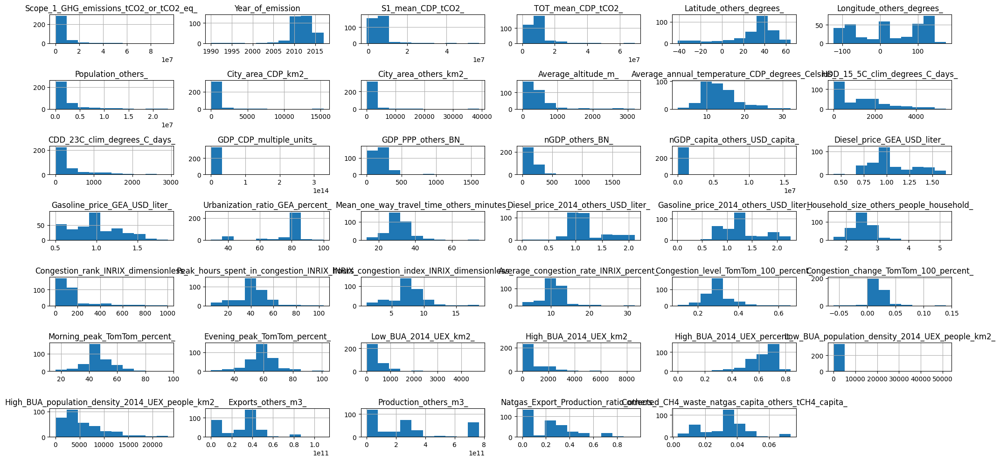

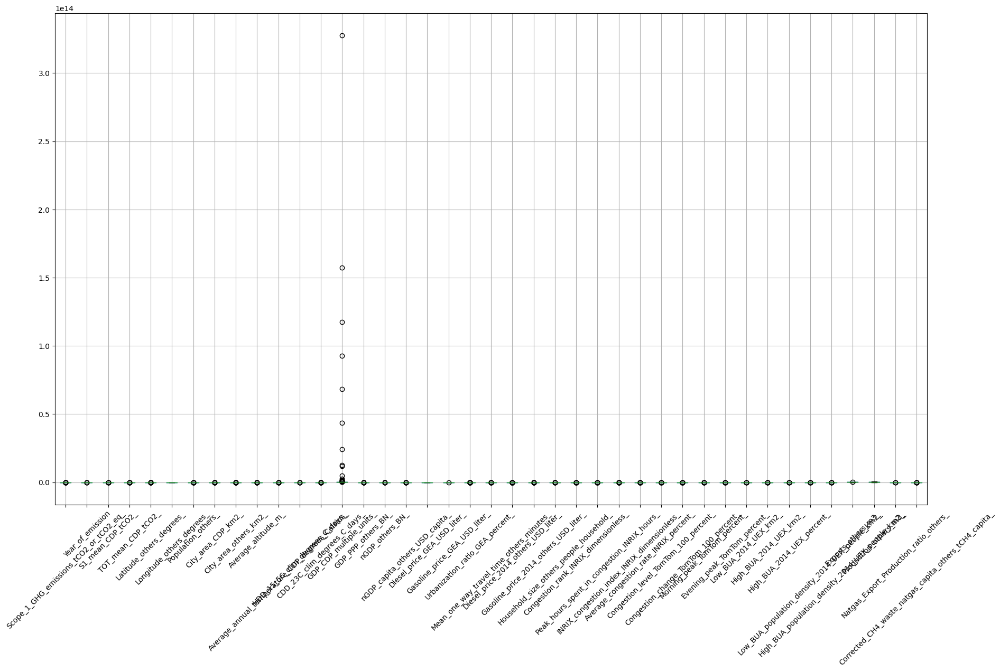

In [8]:
# Run Visualization for Knn Dataset
viz_outliers(df_knn)

##Description mean imputation Dataset

In [9]:
# Display the first 5 rows of the DataFrame df_mean to get an impression
df_mean.head()


,City,Country,Region,Scope_1_GHG_emissions_tCO2_or_tCO2_eq_,Year_of_emission,S1_mean_CDP_tCO2_,TOT_mean_CDP_tCO2_,Latitude_others_degrees_,Longitude_others_degrees_,Population_others_,...,Evening_peak_TomTom_percent_,Low_BUA_2014_UEX_km2_,High_BUA_2014_UEX_km2_,High_BUA_2014_UEX_percent_,Low_BUA_population_density_2014_UEX_people_km2_,High_BUA_population_density_2014_UEX_people_km2_,Exports_others_m3_,Production_others_m3_,Natgas_Export_Production_ratio_others_,Corrected_CH4_waste_natgas_capita_others_tCH4_capita_
0,Aarhus,Denmark,Europe,8462230.56,2016,5769379.80,8963999.85,56.17,10.25,330639.00,...,39.00,42.69,93.31,0.69,244.12,2783.30,4517000000.00,6412000000.00,0.70,0.01
1,Abington,USA,North America,193345.00,2010,152023.37,573902.37,40.10,-75.10,55557.00,...,58.12,364.50,729.05,0.61,913.64,6169.39,42870000000.00,766200000000.00,0.06,0.04
2,Addis Ababa,Ethiopia,Africa,3708292.00,2012,2640911.24,2640911.24,9.03,38.74,3270000.00,...,58.12,202.12,281.75,0.58,1600.28,13451.84,0.00,1.00,0.00,0.02
3,Adelaide,Australia,Oceania,63724.00,2013,43783.26,466600.26,-34.93,138.60,22393.00,...,41.00,250.12,639.25,0.72,74.79,1789.26,31610000000.00,62640000000.00,0.50,0.03
4,Aerøskøbing,Denmark,Europe,8462230.56,2015,5769379.80,8963999.85,54.88,10.33,6383.00,...,58.12,364.50,729.05,0.61,913.64,6169.39,4517000000.00,6412000000.00,0.70,0.01


In [10]:
# Displaying a summary of the DataFrame df_mean
df_mean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 343 entries, 0 to 342
Data columns (total 44 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   City                                                   343 non-null    object 
 1   Country                                                343 non-null    object 
 2   Region                                                 343 non-null    object 
 3   Scope_1_GHG_emissions_tCO2_or_tCO2_eq_                 343 non-null    float64
 4   Year_of_emission                                       343 non-null    int64  
 5   S1_mean_CDP_tCO2_                                      343 non-null    float64
 6   TOT_mean_CDP_tCO2_                                     343 non-null    float64
 7   Latitude_others_degrees_                               343 non-null    float64
 8   Longitude_others_degrees_                         

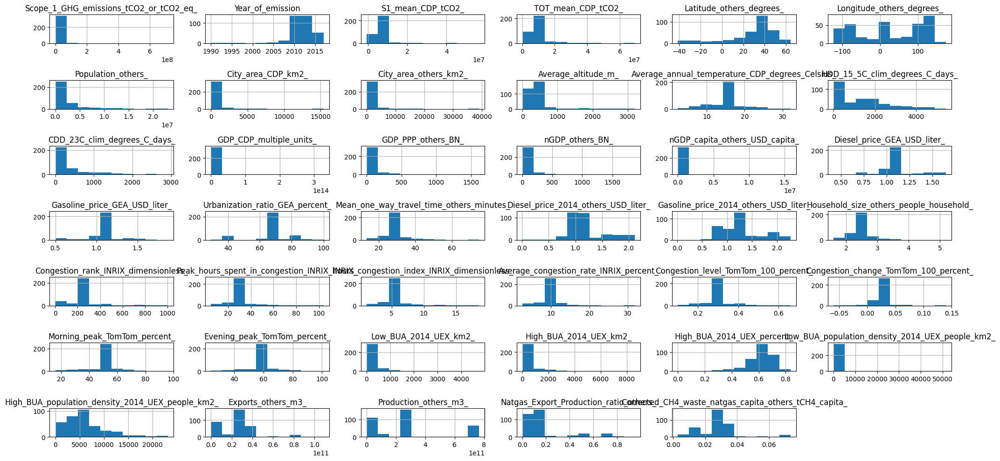

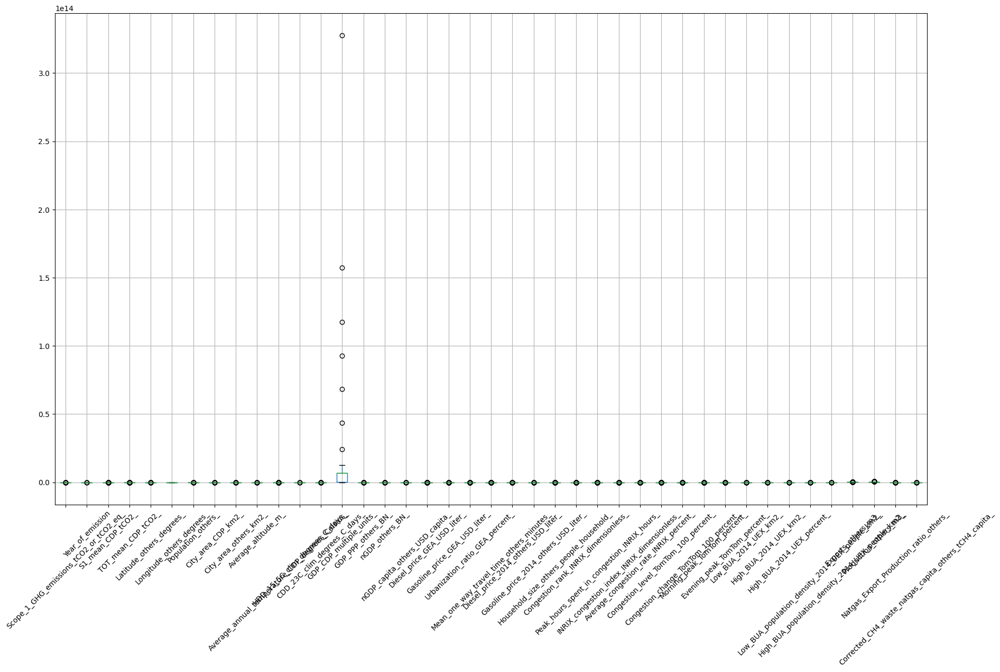

In [11]:
# Run Visualization for mean Dataset
viz_outliers(df_mean)

##Description Randomforest imputation Dataset

In [12]:
# Display the first 5 rows of the DataFrame df_rf
df_rf.head()


,City,Country,Region,Scope_1_GHG_emissions_tCO2_or_tCO2_eq_,Year_of_emission,S1_mean_CDP_tCO2_,TOT_mean_CDP_tCO2_,Latitude_others_degrees_,Longitude_others_degrees_,Population_others_,...,Evening_peak_TomTom_percent_,Low_BUA_2014_UEX_km2_,High_BUA_2014_UEX_km2_,High_BUA_2014_UEX_percent_,Low_BUA_population_density_2014_UEX_people_km2_,High_BUA_population_density_2014_UEX_people_km2_,Exports_others_m3_,Production_others_m3_,Natgas_Export_Production_ratio_others_,Corrected_CH4_waste_natgas_capita_others_tCH4_capita_
0,Aarhus,Denmark,Europe,289000.00,2016,142424.09,1827915.01,56.17,10.25,330639,...,39,42.69,93.31,0.69,244.12,2783.30,4517000000.00,6412000000.00,0.70,0.01
1,Abington,USA,North America,193345.00,2010,152023.37,573902.37,40.10,-75.10,55557,...,67,99.88,83.69,0.63,349.26,4454.59,42870000000.00,766200000000.00,0.06,0.04
2,Addis Ababa,Ethiopia,Africa,3708292.00,2012,2640911.24,2640911.24,9.03,38.74,3270000,...,84,202.12,281.75,0.58,1600.28,13451.84,0.00,1.00,0.00,0.02
3,Adelaide,Australia,Oceania,63724.00,2013,43783.26,466600.26,-34.93,138.60,22393,...,41,250.12,639.25,0.72,74.79,1789.26,31610000000.00,62640000000.00,0.50,0.03
4,Aerøskøbing,Denmark,Europe,565382.00,2015,751252.64,213935.48,54.88,10.33,6383,...,44,3.62,146.81,0.05,407.46,6492.96,4517000000.00,6412000000.00,0.70,0.01


In [13]:
# Displaying a summary of the DataFrame df_rf
df_rf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 343 entries, 0 to 342
Data columns (total 44 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   City                                                   343 non-null    object 
 1   Country                                                343 non-null    object 
 2   Region                                                 343 non-null    object 
 3   Scope_1_GHG_emissions_tCO2_or_tCO2_eq_                 343 non-null    float64
 4   Year_of_emission                                       343 non-null    int64  
 5   S1_mean_CDP_tCO2_                                      343 non-null    float64
 6   TOT_mean_CDP_tCO2_                                     343 non-null    float64
 7   Latitude_others_degrees_                               343 non-null    float64
 8   Longitude_others_degrees_                         

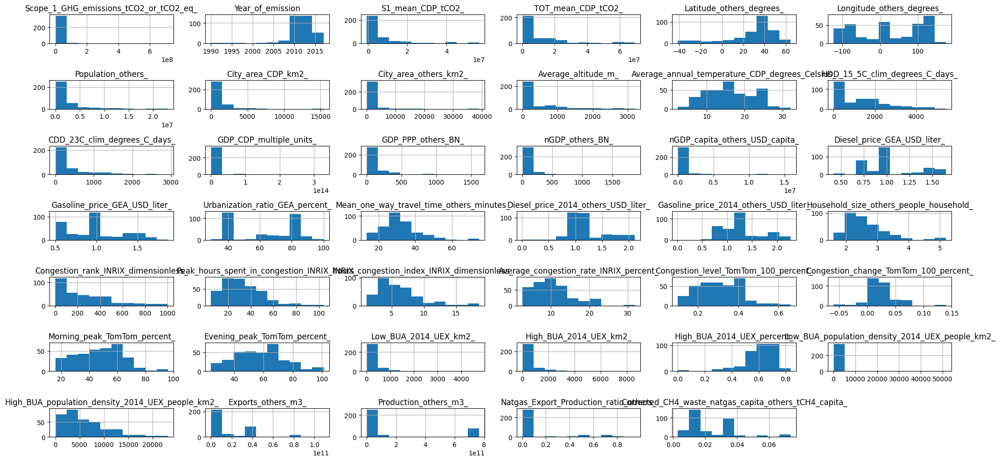

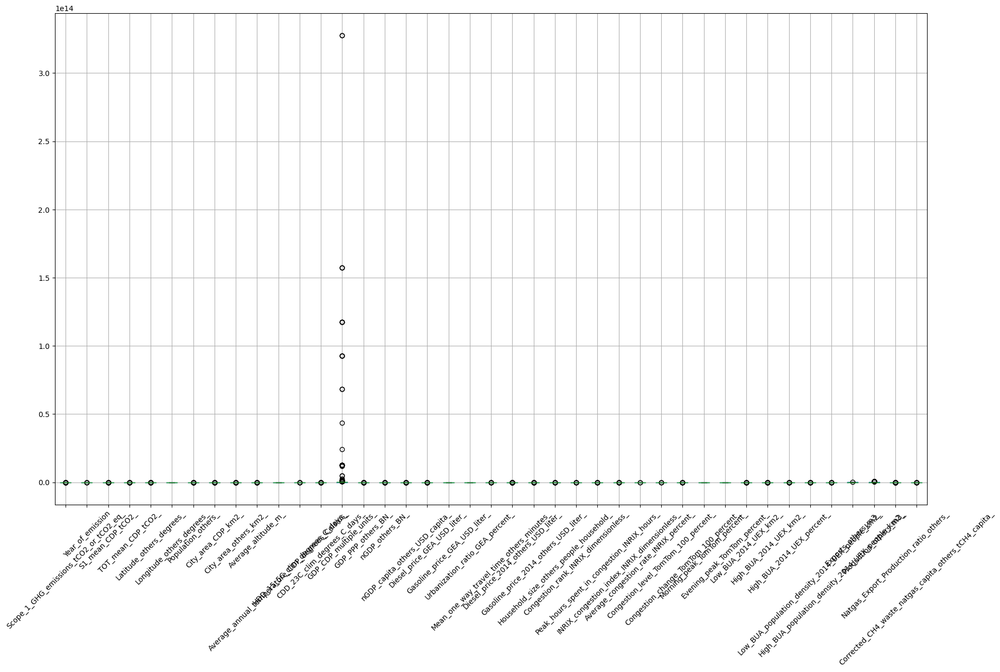

In [14]:
# Run Visualization for RF Dataset
viz_outliers(df_rf)

In [15]:
def select_columns(df):
    """
    Select specific columns from the input DataFrame.

    Parameters:
        df (pd.DataFrame): The DataFrame to select columns from.

    Returns:
        pd.DataFrame: The DataFrame with the selected columns.
    """
    # Order columns in dataframes
    columns_to_select = ['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                         'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'S1_mean_CDP_tCO2_',
                         'TOT_mean_CDP_tCO2_', 'Population_others_', 'City_area_CDP_km2_',
                         'City_area_others_km2_', 'Average_altitude_m_',
                         'Average_annual_temperature_CDP_degrees_Celsius_', 'HDD_15_5C_clim_degrees_C_days_',
                         'CDD_23C_clim_degrees_C_days_', 'GDP_CDP_multiple_units_', 'GDP_PPP_others_BN_',
                         'nGDP_others_BN_', 'nGDP_capita_others_USD_capita_', 'Diesel_price_GEA_USD_liter_',
                         'Gasoline_price_GEA_USD_liter_', 'Urbanization_ratio_GEA_percent_',
                         'Mean_one_way_travel_time_others_minutes_', 'Diesel_price_2014_others_USD_liter_',
                         'Gasoline_price_2014_others_USD_liter_', 'Household_size_others_people_household_',
                         'Congestion_rank_INRIX_dimensionless_', 'Peak_hours_spent_in_congestion_INRIX_hours_',
                         'INRIX_congestion_index_INRIX_dimensionless_', 'Average_congestion_rate_INRIX_percent_',
                         'Congestion_level_TomTom_100_percent_', 'Congestion_change_TomTom_100_percent_',
                         'Morning_peak_TomTom_percent_', 'Evening_peak_TomTom_percent_', 'Low_BUA_2014_UEX_km2_',
                         'High_BUA_2014_UEX_km2_', 'High_BUA_2014_UEX_percent_',
                         'Low_BUA_population_density_2014_UEX_people_km2_',
                         'High_BUA_population_density_2014_UEX_people_km2_', 'Exports_others_m3_',
                         'Production_others_m3_', 'Natgas_Export_Production_ratio_others_',
                         'Corrected_CH4_waste_natgas_capita_others_tCH4_capita_']

    return df[columns_to_select]

In [16]:
df_knn.head()

,City,Country,Region,Scope_1_GHG_emissions_tCO2_or_tCO2_eq_,Year_of_emission,S1_mean_CDP_tCO2_,TOT_mean_CDP_tCO2_,Latitude_others_degrees_,Longitude_others_degrees_,Population_others_,...,Evening_peak_TomTom_percent_,Low_BUA_2014_UEX_km2_,High_BUA_2014_UEX_km2_,High_BUA_2014_UEX_percent_,Low_BUA_population_density_2014_UEX_people_km2_,High_BUA_population_density_2014_UEX_people_km2_,Exports_others_m3_,Production_others_m3_,Natgas_Export_Production_ratio_others_,Corrected_CH4_waste_natgas_capita_others_tCH4_capita_
0,Aarhus,Denmark,Europe,4928630.94,2016,3878653.21,6594344.42,56.17,10.25,330639.00,...,39.00,42.69,93.31,0.69,244.12,2783.30,4517000000.00,6412000000.00,0.70,0.01
1,Abington,USA,North America,193345.00,2010,152023.37,573902.37,40.10,-75.10,55557.00,...,64.25,670.24,1968.37,0.74,228.69,1990.82,42870000000.00,766200000000.00,0.06,0.04
2,Addis Ababa,Ethiopia,Africa,3708292.00,2012,2640911.24,2640911.24,9.03,38.74,3270000.00,...,52.98,202.12,281.75,0.58,1600.28,13451.84,0.00,1.00,0.00,0.02
3,Adelaide,Australia,Oceania,63724.00,2013,43783.26,466600.26,-34.93,138.60,22393.00,...,41.00,250.12,639.25,0.72,74.79,1789.26,31610000000.00,62640000000.00,0.50,0.03
4,Aerøskøbing,Denmark,Europe,4747558.86,2015,3686008.13,6304042.68,54.88,10.33,6383.00,...,66.48,625.46,1646.52,0.71,326.96,4677.40,4517000000.00,6412000000.00,0.70,0.01


#Preprocessing


In [17]:
# Sort columns for all dataframes
df_mean= select_columns(df_mean)
df_knn= select_columns(df_knn)
df_rf= select_columns(df_rf)

##Normalization of all three dataset

In [18]:
def normalize_dataframe(input_df):
    '''
    Normalize the numeric columns of the input DataFrame using StandardScaler.

    Parameters:
    - input_df (pd.DataFrame): The DataFrame to be normalized.

    Returns:
    - pd.DataFrame: The DataFrame with the normalized numeric columns combined with the non-numeric columns.
    '''

    # Select the numeric columns to be normalized (Starting with 7 because the first 8 Elements are not numeric)
    numeric_cols = input_df.columns[7:]

    # Extract a DataFrame containing only the numeric columns
    df_numeric = input_df[numeric_cols]

    # Initialize StandardScaler for normalization
    scaler = StandardScaler()

    # Normalize the selected numeric columns using StandardScaler
    df_normalized = pd.DataFrame(scaler.fit_transform(df_numeric), columns=df_numeric.columns)

    # Combine the normalized numeric columns with the non-numeric columns
    df_normalized_combined = pd.concat([input_df.iloc[:, :7], df_normalized], axis=1)

    return df_normalized_combined

In [19]:
# Normalize all dataframe with the nomalize_dataframe function
df_rf_norm = normalize_dataframe(df_rf)
df_mean_norm = normalize_dataframe(df_mean)
df_knn_norm = normalize_dataframe(df_knn)

In [20]:
df_rf_norm

,City,Country,Region,Latitude_others_degrees_,Longitude_others_degrees_,Scope_1_GHG_emissions_tCO2_or_tCO2_eq_,Year_of_emission,S1_mean_CDP_tCO2_,TOT_mean_CDP_tCO2_,Population_others_,...,Evening_peak_TomTom_percent_,Low_BUA_2014_UEX_km2_,High_BUA_2014_UEX_km2_,High_BUA_2014_UEX_percent_,Low_BUA_population_density_2014_UEX_people_km2_,High_BUA_population_density_2014_UEX_people_km2_,Exports_others_m3_,Production_others_m3_,Natgas_Export_Production_ratio_others_,Corrected_CH4_waste_natgas_capita_others_tCH4_capita_
0,Aarhus,Denmark,Europe,56.17,10.25,289000.00,2016,-0.56,-0.59,-0.56,...,-1.09,-0.51,-0.50,0.67,-0.22,-0.74,-0.49,-0.56,2.62,-0.80
1,Abington,USA,North America,40.10,-75.10,193345.00,2010,-0.56,-0.67,-0.65,...,0.58,-0.41,-0.51,0.20,-0.18,-0.36,1.18,1.85,-0.25,0.73
2,Addis Ababa,Ethiopia,Africa,9.03,38.74,3708292.00,2012,-0.35,-0.54,0.35,...,1.59,-0.23,-0.34,-0.19,0.26,1.72,-0.69,-0.58,-0.52,-0.42
3,Adelaide,Australia,Oceania,-34.93,138.60,63724.00,2013,-0.57,-0.68,-0.66,...,-0.97,-0.15,-0.04,0.95,-0.28,-0.97,0.69,-0.38,1.72,0.60
4,Aerøskøbing,Denmark,Europe,54.88,10.33,565382.00,2015,-0.51,-0.70,-0.66,...,-0.79,-0.58,-0.45,-4.63,-0.16,0.11,-0.49,-0.56,2.62,-0.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338,Zürich,Switzerland,Europe,47.37,8.55,3293000.00,2014,-0.36,-0.60,-0.54,...,0.34,-0.33,-0.37,0.17,-0.18,-0.48,-0.69,-0.58,-0.52,-1.10
339,eThekwini,South Africa,Africa,-29.86,31.02,22118090.00,2015,0.74,-0.54,0.40,...,-0.49,0.08,0.08,0.54,-0.11,-0.49,-0.18,-0.58,2.58,-0.70
340,Águeda,Portugal,Europe,40.57,-8.45,2127000.00,2013,-0.52,-0.70,-0.65,...,-1.44,-0.53,-0.55,-0.66,-0.24,-1.22,-0.69,-0.58,-0.52,0.77
341,Örebro,Sweden,Europe,59.27,15.22,470149.00,2015,-0.54,0.34,-0.62,...,0.40,-0.55,-0.55,0.01,-0.11,-0.54,-0.49,-0.58,-0.52,1.27


In [21]:
df_rf_norm

,City,Country,Region,Latitude_others_degrees_,Longitude_others_degrees_,Scope_1_GHG_emissions_tCO2_or_tCO2_eq_,Year_of_emission,S1_mean_CDP_tCO2_,TOT_mean_CDP_tCO2_,Population_others_,...,Evening_peak_TomTom_percent_,Low_BUA_2014_UEX_km2_,High_BUA_2014_UEX_km2_,High_BUA_2014_UEX_percent_,Low_BUA_population_density_2014_UEX_people_km2_,High_BUA_population_density_2014_UEX_people_km2_,Exports_others_m3_,Production_others_m3_,Natgas_Export_Production_ratio_others_,Corrected_CH4_waste_natgas_capita_others_tCH4_capita_
0,Aarhus,Denmark,Europe,56.17,10.25,289000.00,2016,-0.56,-0.59,-0.56,...,-1.09,-0.51,-0.50,0.67,-0.22,-0.74,-0.49,-0.56,2.62,-0.80
1,Abington,USA,North America,40.10,-75.10,193345.00,2010,-0.56,-0.67,-0.65,...,0.58,-0.41,-0.51,0.20,-0.18,-0.36,1.18,1.85,-0.25,0.73
2,Addis Ababa,Ethiopia,Africa,9.03,38.74,3708292.00,2012,-0.35,-0.54,0.35,...,1.59,-0.23,-0.34,-0.19,0.26,1.72,-0.69,-0.58,-0.52,-0.42
3,Adelaide,Australia,Oceania,-34.93,138.60,63724.00,2013,-0.57,-0.68,-0.66,...,-0.97,-0.15,-0.04,0.95,-0.28,-0.97,0.69,-0.38,1.72,0.60
4,Aerøskøbing,Denmark,Europe,54.88,10.33,565382.00,2015,-0.51,-0.70,-0.66,...,-0.79,-0.58,-0.45,-4.63,-0.16,0.11,-0.49,-0.56,2.62,-0.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
338,Zürich,Switzerland,Europe,47.37,8.55,3293000.00,2014,-0.36,-0.60,-0.54,...,0.34,-0.33,-0.37,0.17,-0.18,-0.48,-0.69,-0.58,-0.52,-1.10
339,eThekwini,South Africa,Africa,-29.86,31.02,22118090.00,2015,0.74,-0.54,0.40,...,-0.49,0.08,0.08,0.54,-0.11,-0.49,-0.18,-0.58,2.58,-0.70
340,Águeda,Portugal,Europe,40.57,-8.45,2127000.00,2013,-0.52,-0.70,-0.65,...,-1.44,-0.53,-0.55,-0.66,-0.24,-1.22,-0.69,-0.58,-0.52,0.77
341,Örebro,Sweden,Europe,59.27,15.22,470149.00,2015,-0.54,0.34,-0.62,...,0.40,-0.55,-0.55,0.01,-0.11,-0.54,-0.49,-0.58,-0.52,1.27


##Distribution Scope 1 Emmission

In [22]:
def plot_emissions_distribution(df):
    """
    Plot the distribution of the 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_' feature from the input DataFrame.

    Parameters:
        df (pd.DataFrame): The DataFrame containing the 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_' feature.
    """

    # Extract the 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_' column
    emissions_column = 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_'
    emissions_data = df[emissions_column]

    # Plot the emission distribution
    plt.figure(figsize=(10, 6))
    plt.hist(emissions_data, bins=200, color='blue', alpha=0.7)
    plt.xlabel('Scope 1 GHG Emissions (tCO2 or tCO2 eq)')
    plt.ylabel('Frequency')
    plt.title('Distribution of Scope 1 GHG Emissions')
    plt.grid(True)
    plt.show()


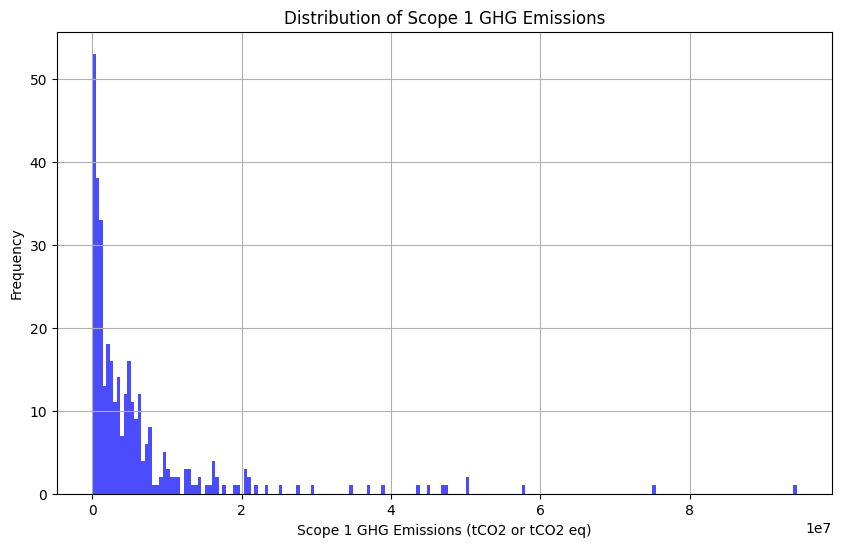

In [23]:
plot_emissions_distribution(df_knn_norm)

In [24]:
# Set Lable on Emmission (5 Labels /20% Buckets)
def categorize_emissions(df):
    """
    Categorize the 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_' column of the input DataFrame based on percentiles.

    Parameters:
        df (pd.DataFrame): The DataFrame containing the 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_' column.

    Returns:
        pd.DataFrame: The DataFrame with the new 'category' column containing the emission categories.
    """

    # Calculate the percentiles
    percentiles = [0, 0.2, 0.4, 0.6, 0.8, 1.0]  # Define the percentile intervals
    values = df['Scope_1_GHG_emissions_tCO2_or_tCO2_eq_'].quantile(percentiles)  # Calculate the corresponding percentile values

    # Create the categories based on percentiles
    categories = ['very high', 'high', 'moderate', 'low', 'very low']
    df['category'] = pd.cut(df['Scope_1_GHG_emissions_tCO2_or_tCO2_eq_'], bins=values, labels=categories, include_lowest=True)

    return df

In [25]:
# set categorical value for all dataframes
df_knn_norm=categorize_emissions(df_knn_norm)
df_rf_norm=categorize_emissions(df_rf_norm)
df_mean_norm=categorize_emissions(df_mean_norm)

# Example
df_knn_norm.head()

,City,Country,Region,Latitude_others_degrees_,Longitude_others_degrees_,Scope_1_GHG_emissions_tCO2_or_tCO2_eq_,Year_of_emission,S1_mean_CDP_tCO2_,TOT_mean_CDP_tCO2_,Population_others_,...,Low_BUA_2014_UEX_km2_,High_BUA_2014_UEX_km2_,High_BUA_2014_UEX_percent_,Low_BUA_population_density_2014_UEX_people_km2_,High_BUA_population_density_2014_UEX_people_km2_,Exports_others_m3_,Production_others_m3_,Natgas_Export_Production_ratio_others_,Corrected_CH4_waste_natgas_capita_others_tCH4_capita_,category
0,Aarhus,Denmark,Europe,56.17,10.25,4928630.94,2016,-0.32,-0.26,-0.56,...,-0.65,-0.65,0.53,-0.20,-0.69,-1.24,-0.99,2.32,-1.49,low
1,Abington,USA,North America,40.10,-75.10,193345.00,2010,-1.00,-0.98,-0.65,...,0.41,0.80,1.04,-0.21,-0.88,0.65,1.84,-0.86,0.19,very high
2,Addis Ababa,Ethiopia,Africa,9.03,38.74,3708292.00,2012,-0.54,-0.73,0.35,...,-0.38,-0.51,-0.40,0.28,1.86,-1.46,-1.01,-1.16,-1.08,moderate
3,Adelaide,Australia,Oceania,-34.93,138.60,63724.00,2013,-1.02,-0.99,-0.66,...,-0.30,-0.23,0.82,-0.26,-0.92,0.09,-0.78,1.33,0.04,very high
4,Aerøskøbing,Denmark,Europe,54.88,10.33,4747558.86,2015,-0.35,-0.30,-0.67,...,0.34,0.55,0.73,-0.17,-0.24,-1.24,-0.99,2.32,-1.49,low


In [26]:
df_knn_norm

,City,Country,Region,Latitude_others_degrees_,Longitude_others_degrees_,Scope_1_GHG_emissions_tCO2_or_tCO2_eq_,Year_of_emission,S1_mean_CDP_tCO2_,TOT_mean_CDP_tCO2_,Population_others_,...,Low_BUA_2014_UEX_km2_,High_BUA_2014_UEX_km2_,High_BUA_2014_UEX_percent_,Low_BUA_population_density_2014_UEX_people_km2_,High_BUA_population_density_2014_UEX_people_km2_,Exports_others_m3_,Production_others_m3_,Natgas_Export_Production_ratio_others_,Corrected_CH4_waste_natgas_capita_others_tCH4_capita_,category
0,Aarhus,Denmark,Europe,56.17,10.25,4928630.94,2016,-0.32,-0.26,-0.56,...,-0.65,-0.65,0.53,-0.20,-0.69,-1.24,-0.99,2.32,-1.49,low
1,Abington,USA,North America,40.10,-75.10,193345.00,2010,-1.00,-0.98,-0.65,...,0.41,0.80,1.04,-0.21,-0.88,0.65,1.84,-0.86,0.19,very high
2,Addis Ababa,Ethiopia,Africa,9.03,38.74,3708292.00,2012,-0.54,-0.73,0.35,...,-0.38,-0.51,-0.40,0.28,1.86,-1.46,-1.01,-1.16,-1.08,moderate
3,Adelaide,Australia,Oceania,-34.93,138.60,63724.00,2013,-1.02,-0.99,-0.66,...,-0.30,-0.23,0.82,-0.26,-0.92,0.09,-0.78,1.33,0.04,very high
4,Aerøskøbing,Denmark,Europe,54.88,10.33,4747558.86,2015,-0.35,-0.30,-0.67,...,0.34,0.55,0.73,-0.17,-0.24,-1.24,-0.99,2.32,-1.49,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
337,Zürich,Switzerland,Europe,47.37,8.55,5026014.44,2014,-0.31,-0.84,-0.54,...,-0.47,-0.53,-0.00,-0.16,-0.42,-1.46,-1.01,-1.16,-1.82,low
338,eThekwini,South Africa,Africa,-29.86,31.02,22118090.00,2015,0.32,0.17,0.40,...,-0.08,-0.12,0.39,-0.09,-0.42,0.04,-0.17,1.05,-0.12,very low
339,Águeda,Portugal,Europe,40.57,-8.45,4641866.96,2013,-0.36,-1.02,-0.65,...,-0.67,-0.70,-0.89,-0.22,-1.18,-1.46,-1.01,-1.16,0.22,low
340,Örebro,Sweden,Europe,59.27,15.22,470149.00,2015,-0.49,-0.45,-0.62,...,-0.69,-0.70,-0.18,-0.09,-0.47,-0.37,-0.82,-0.09,-0.06,very high


#Random Forest Classification

In [27]:

def calculate_rf_classifier_accuracy_param(df, criterion='gini', n_estimators=100, max_leaf_nodes=15):
    """
    Calculate the accuracy of a Random Forest Classifier using the input DataFrame and optional hyperparameters.

    Parameters:
        df (pd.DataFrame): The DataFrame containing the input features and the target variable 'category'.
        criterion (str, optional): The function to measure the quality of a split (default is "gini").
        n_estimators (int, optional): The number of trees in the forest (default is 270).
        max_leaf_nodes (int, optional): The maximum number of leaf nodes in each tree (default is 8).

    Returns:
        float: The accuracy of the Random Forest Classifier.
    """

    # Prepare the data
    X = df.drop(columns=['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                         'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category',
                         'S1_mean_CDP_tCO2_'])
    # Set Vaiable which should be predicted
    y = df['category']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create a Random Forest Classifier with the specified hyperparameters
    rf_classifier = RandomForestClassifier(criterion=criterion, n_estimators=n_estimators, max_leaf_nodes=max_leaf_nodes, random_state=43)

    # Train the classifier on the training data
    rf_classifier.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = rf_classifier.predict(X_test)


    # Evaluate the classifier with four metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Create a dictionary to store the metrics
    metrics = {
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
    }
    #return accuracy as one value and the list of metrics as another
    return accuracy, metrics



##Benchmarks with default values

In [28]:
#Visualize metrics
print(calculate_rf_classifier_accuracy_param(df_knn_norm))
print(calculate_rf_classifier_accuracy_param(df_rf_norm))
print(calculate_rf_classifier_accuracy_param(df_mean_norm))


(0.5362318840579711, {'Accuracy': 0.5362318840579711, 'Precision': 0.550884622623753, 'Recall': 0.5362318840579711, 'F1-Score': 0.526137298230382})
(0.6086956521739131, {'Accuracy': 0.6086956521739131, 'Precision': 0.6283643892339545, 'Recall': 0.6086956521739131, 'F1-Score': 0.6151517175360092})
(0.5652173913043478, {'Accuracy': 0.5652173913043478, 'Precision': 0.5640276177360576, 'Recall': 0.5652173913043478, 'F1-Score': 0.5612299670270685})


##Recursiv Feature Elemination

In [29]:

def feature_selection_rfe(df):
    """
    Perform Recursive Feature Elimination (RFE) using a Random Forest Classifier.

    Parameters:
        df (pd.DataFrame): The DataFrame containing the input features and the target variable.

    Returns:
        list: A boolean array that indicates which features were selected (True) and which were eliminated (False)
        list: The rank assigned to each feature based on their importance in the feature selection process.
    """

    # Assuming the category column is the the last in the DataFrame (it is^^)
    target_column = df.columns[-1]
    # Prepare Dataset, deleting all values which are not used.
    X = df.drop(columns=['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                         'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category',
                         'S1_mean_CDP_tCO2_'])
     # Set Vaiable which should be predicted
    y = df['category']

    rf_classifier = RandomForestClassifier(criterion="gini", random_state=43)
    # Using RFECV funciton from SKlearn to predict the selectors
    selector = RFECV(rf_classifier)

    #getting a numeric ranking
    selector = selector.fit(X, y)
    #get true/false pairs of usefullness
    support = selector.support_


    return support, selector.ranking_,



###REF KNN Dataset

In [30]:
#Visualize return values of RFE
feature_selection_rfe(df_knn_norm)

(array([ True,  True,  True,  True,  True, False, False, False,  True,
         True,  True,  True, False, False, False,  True, False, False,
        False,  True,  True,  True, False, False, False,  True, False,
         True,  True,  True, False,  True, False, False, False, False]),
 array([ 1,  1,  1,  1,  1, 10,  7, 14,  1,  1,  1,  1, 11, 15,  4,  1, 19,
        18,  6,  1,  1,  1,  9,  3, 12,  1,  2,  1,  1,  1,  5,  1, 16, 13,
        17,  8]))

    'TOT_mean_CDP_tCO2_' - 1
    'Population_others_' - 1
    'City_area_CDP_km2_' - 1
    'City_area_others_km2_' - 1
    'Average_altitude_m_' - 1
    'Average_annual_temperature_CDP_degrees_Celsius_' - 10
    'HDD_15_5C_clim_degrees_C_days_' - 7
    'CDD_23C_clim_degrees_C_days_' - 14
    'GDP_CDP_multiple_units_' - 1
    'GDP_PPP_others_BN_' - 1
    'nGDP_others_BN_' - 1
    'nGDP_capita_others_USD_capita_' - 1
    'Diesel_price_GEA_USD_liter_' - 11
    'Gasoline_price_GEA_USD_liter_' - 15
    'Urbanization_ratio_GEA_percent_' - 4
    'Mean_one_way_travel_time_others_minutes_' - 1
    'Diesel_price_2014_others_USD_liter_' - 19
    'Gasoline_price_2014_others_USD_liter_' - 18
    'Household_size_others_people_household_' - 6
    'Congestion_rank_INRIX_dimensionless_' - 1
    'Peak_hours_spent_in_congestion_INRIX_hours_' - 1
    'INRIX_congestion_index_INRIX_dimensionless_' - 1
    'Average_congestion_rate_INRIX_percent_' - 9
    'Congestion_level_TomTom_100_percent_' - 3
    'Congestion_change_TomTom_100_percent_' - 12
    'Morning_peak_TomTom_percent_' - 1
    'Evening_peak_TomTom_percent_' - 2
    'Low_BUA_2014_UEX_km2_' - 1
    'High_BUA_2014_UEX_km2_' - 1
    'High_BUA_2014_UEX_percent_' - 1
    'Low_BUA_population_density_2014_UEX_people_km2_' - 5
    'High_BUA_population_density_2014_UEX_people_km2_' - 1
    'Exports_others_m3_' - 16
    'Production_others_m3_' - 13
    'Natgas_Export_Production_ratio_others_' - 17
    'Corrected_CH4_waste_natgas_capita_others_tCH4_capita_' - 8

In [31]:
# Creating the new DataFrame 'df_knn_RFE' with selected columns from 'df_knn_norm'
# new Dataframe after deleting the 5 features with the lowes support
df_knn_RFE = df_knn_norm[['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                   'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'S1_mean_CDP_tCO2_',
                   'TOT_mean_CDP_tCO2_', 'Population_others_', 'City_area_CDP_km2_', 'City_area_others_km2_',
                   'Average_altitude_m_', 'HDD_15_5C_clim_degrees_C_days_', 'CDD_23C_clim_degrees_C_days_',
                   'GDP_CDP_multiple_units_', 'GDP_PPP_others_BN_', 'nGDP_others_BN_',
                   'nGDP_capita_others_USD_capita_', 'Diesel_price_GEA_USD_liter_', 'Urbanization_ratio_GEA_percent_',
                   'Mean_one_way_travel_time_others_minutes_', 'Diesel_price_2014_others_USD_liter_',
                   'Congestion_rank_INRIX_dimensionless_', 'Peak_hours_spent_in_congestion_INRIX_hours_',
                   'INRIX_congestion_index_INRIX_dimensionless_', 'Average_congestion_rate_INRIX_percent_',
                   'Congestion_level_TomTom_100_percent_', 'Congestion_change_TomTom_100_percent_',
                   'Morning_peak_TomTom_percent_', 'Evening_peak_TomTom_percent_', 'Low_BUA_2014_UEX_km2_',
                   'High_BUA_2014_UEX_km2_', 'High_BUA_2014_UEX_percent_', 'Low_BUA_population_density_2014_UEX_people_km2_',
                   'High_BUA_population_density_2014_UEX_people_km2_', 'Production_others_m3_',
                   'Corrected_CH4_waste_natgas_capita_others_tCH4_capita_', 'category']].copy()

###RFE RF Dataset

In [32]:
#Visualize return values of RFE
feature_selection_rfe(df_rf_norm)

(array([ True,  True,  True,  True, False, False, False, False, False,
         True,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
         True,  True,  True, False, False, False, False, False, False]),
 array([ 1,  1,  1,  1,  8, 16, 17, 20,  9,  1,  1,  3, 25, 24, 23,  2, 14,
        22,  6,  4, 15, 13, 11, 19, 21, 10,  7,  1,  1,  1, 12,  5, 27, 28,
        26, 18]))

Visualized Output in comparision with all features

In [ ]:
   '''
    'TOT_mean_CDP_tCO2_' - 1
    'Population_others_' - 1
    'City_area_CDP_km2_' - 1
    'City_area_others_km2_' - 1
    'Average_altitude_m_' - 8
    'Average_annual_temperature_CDP_degrees_Celsius_' - 16
    'HDD_15_5C_clim_degrees_C_days_' - 17
    'CDD_23C_clim_degrees_C_days_' - 20
    'GDP_CDP_multiple_units_' - 9
    'GDP_PPP_others_BN_' - 1
    'nGDP_others_BN_' - 1
    'nGDP_capita_others_USD_capita_' - 3
    'Diesel_price_GEA_USD_liter_' - 25
    'Gasoline_price_GEA_USD_liter_' - 24
    'Urbanization_ratio_GEA_percent_' - 23
    'Mean_one_way_travel_time_others_minutes_' - 2
    'Diesel_price_2014_others_USD_liter_' - 14
    'Gasoline_price_2014_others_USD_liter_' - 22
    'Household_size_others_people_household_' - 6
    'Congestion_rank_INRIX_dimensionless_' - 4
    'Peak_hours_spent_in_congestion_INRIX_hours_' - 15
    'INRIX_congestion_index_INRIX_dimensionless_' - 13
    'Average_congestion_rate_INRIX_percent_' - 11
    'Congestion_level_TomTom_100_percent_' - 19
    'Congestion_change_TomTom_100_percent_' - 21
    'Morning_peak_TomTom_percent_' - 10
    'Evening_peak_TomTom_percent_' - 7
    'Low_BUA_2014_UEX_km2_' - 1
    'High_BUA_2014_UEX_km2_' - 1
    'High_BUA_2014_UEX_percent_' - 1
    'Low_BUA_population_density_2014_UEX_people_km2_' - 12
    'High_BUA_population_density_2014_UEX_people_km2_' - 5
    'Exports_others_m3_' - 27
    'Production_others_m3_' - 28
    'Natgas_Export_Production_ratio_others_' - 26
    'Corrected_CH4_waste_natgas_capita_others_tCH4_capita_' - 18
    '''

In [33]:
#new Dataframe after deleting the 5 features with the lowes support
df_rf_RFE = df_rf_norm[['City', 'Country', 'Region', 'Latitude_others_degrees_',
       'Longitude_others_degrees_', 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission',
       'S1_mean_CDP_tCO2_', 'TOT_mean_CDP_tCO2_', 'Population_others_',
       'City_area_CDP_km2_', 'City_area_others_km2_','Average_altitude_m_',
       'Average_annual_temperature_CDP_degrees_Celsius_',
       'HDD_15_5C_clim_degrees_C_days_', 'CDD_23C_clim_degrees_C_days_',
       'GDP_CDP_multiple_units_', 'GDP_PPP_others_BN_', 'nGDP_others_BN_',
       'nGDP_capita_others_USD_capita_', 'Diesel_price_GEA_USD_liter_',
       'Gasoline_price_GEA_USD_liter_', 'Urbanization_ratio_GEA_percent_',
       'Mean_one_way_travel_time_others_minutes_', 'Household_size_others_people_household_',
       'Congestion_rank_INRIX_dimensionless_', 'Peak_hours_spent_in_congestion_INRIX_hours_',
       'INRIX_congestion_index_INRIX_dimensionless_', 'Average_congestion_rate_INRIX_percent_',
       'Congestion_level_TomTom_100_percent_', 'Congestion_change_TomTom_100_percent_',
       'Morning_peak_TomTom_percent_', 'Evening_peak_TomTom_percent_', 'Low_BUA_2014_UEX_km2_',
        'High_BUA_2014_UEX_km2_', 'High_BUA_2014_UEX_percent_', 'Low_BUA_population_density_2014_UEX_people_km2_',
       'High_BUA_population_density_2014_UEX_people_km2_', 'Corrected_CH4_waste_natgas_capita_others_tCH4_capita_',
       'category']].copy()

###RFE Mean Dataset

In [34]:
#Visualize return values of RFE
feature_selection_rfe(df_mean_norm)

(array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
         True,  True,  True,  True, False, False,  True,  True,  True,
         True,  True,  True, False,  True,  True, False,  True,  True,
         True,  True,  True,  True,  True,  True, False, False,  True]),
 array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 4, 5, 1, 1, 1, 1, 1, 1, 6,
        1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 3, 7, 1]))

    #Visualized Output in comparision with all features
    'TOT_mean_CDP_tCO2_' - 1
    'Population_others_' - 1
    'City_area_CDP_km2_' - 1
    'City_area_others_km2_' - 1
    'Average_altitude_m_' - 1
    'Average_annual_temperature_CDP_degrees_Celsius_' - 1
    'HDD_15_5C_clim_degrees_C_days_' - 1
    'CDD_23C_clim_degrees_C_days_' - 1
    'GDP_CDP_multiple_units_' - 1
    'GDP_PPP_others_BN_' - 1
    'nGDP_others_BN_' - 1
    'nGDP_capita_others_USD_capita_' - 1
    'Diesel_price_GEA_USD_liter_' - 1
    'Gasoline_price_GEA_USD_liter_' - 4
    'Urbanization_ratio_GEA_percent_' - 5
    'Mean_one_way_travel_time_others_minutes_' - 1
    'Diesel_price_2014_others_USD_liter_' - 1
    'Gasoline_price_2014_others_USD_liter_' - 1
    'Household_size_others_people_household_' - 1
    'Congestion_rank_INRIX_dimensionless_' - 1
    'Peak_hours_spent_in_congestion_INRIX_hours_' - 1
    'INRIX_congestion_index_INRIX_dimensionless_' - 6
    'Average_congestion_rate_INRIX_percent_' - 1
    'Congestion_level_TomTom_100_percent_' - 1
    'Congestion_change_TomTom_100_percent_' - 1
    'Morning_peak_TomTom_percent_' - 1
    'Evening_peak_TomTom_percent_' - 1
    'Low_BUA_2014_UEX_km2_' - 1
    'High_BUA_2014_UEX_km2_' - 1
    'High_BUA_2014_UEX_percent_' - 1
    'Low_BUA_population_density_2014_UEX_people_km2_' - 1
    'High_BUA_population_density_2014_UEX_people_km2_' - 1
    'Exports_others_m3_' - 1
    'Production_others_m3_' - 3
    'Natgas_Export_Production_ratio_others_' - 7
    'Corrected_CH4_waste_natgas_capita_others_tCH4_capita_' - 1

In [35]:
#new Dataframe after deleting the 5 features with the lowes support
df_mean_RFE = df_mean_norm[['City', 'Country', 'Region', 'Latitude_others_degrees_',
       'Longitude_others_degrees_', 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission',
       'S1_mean_CDP_tCO2_', 'TOT_mean_CDP_tCO2_', 'Population_others_', 'City_area_CDP_km2_',
      'City_area_others_km2_', 'Average_altitude_m_', 'Average_annual_temperature_CDP_degrees_Celsius_',
       'HDD_15_5C_clim_degrees_C_days_', 'CDD_23C_clim_degrees_C_days_', 'GDP_CDP_multiple_units_',
       'GDP_PPP_others_BN_', 'nGDP_others_BN_', 'nGDP_capita_others_USD_capita_', 'Diesel_price_GEA_USD_liter_',
       'Mean_one_way_travel_time_others_minutes_', 'Diesel_price_2014_others_USD_liter_',
       'Gasoline_price_2014_others_USD_liter_', 'Household_size_others_people_household_',
       'Congestion_rank_INRIX_dimensionless_', 'Peak_hours_spent_in_congestion_INRIX_hours_',
       'Average_congestion_rate_INRIX_percent_', 'Congestion_level_TomTom_100_percent_',
       'Congestion_change_TomTom_100_percent_', 'Morning_peak_TomTom_percent_', 'Evening_peak_TomTom_percent_',
       'Low_BUA_2014_UEX_km2_', 'High_BUA_2014_UEX_km2_', 'High_BUA_2014_UEX_percent_',
       'Low_BUA_population_density_2014_UEX_people_km2_', 'High_BUA_population_density_2014_UEX_people_km2_',
       'Exports_others_m3_', 'Corrected_CH4_waste_natgas_capita_others_tCH4_capita_', 'category']].copy()

##HyperParameter Tuning

In [36]:

def perform_hyperparameter_tuning(df):
    """
    Perform hyperparameter tuning for a Random Forest Classifier using Bayesian Optimization.

    Parameters:
        df (pd.DataFrame): The DataFrame containing the features and target variable.

    Returns:
        dict: The best hyperparameters found during tuning.
        float: The accuracy of the classifier with the best hyperparameters.
    """

    # Split the data into features (X) and target variable (y)
    X = df.drop(columns=['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                         'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category',
                         'S1_mean_CDP_tCO2_'])
    y = df['category']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=43)

    # Define the parameter search space for Bayesian Optimization
    param_space = {
        'n_estimators': (100, 500),
        'max_depth': (3, 15),
        'criterion': ['gini', 'entropy']
    }

    # Create a Random Forest Classifier
    rf_classifier = RandomForestClassifier(random_state=12345)

    # Perform Bayesian Optimization for hyperparameter tuning
    bayes_search = BayesSearchCV(estimator=rf_classifier, search_spaces=param_space, n_iter=25, cv=5, scoring='accuracy')
    bayes_search.fit(X_train, y_train)

    # Get the best hyperparameters
    best_params = bayes_search.best_params_

    # Train the classifier on the training data using the best hyperparameters
    rf_classifier = RandomForestClassifier(**best_params, random_state=12345)
    rf_classifier.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = rf_classifier.predict(X_test)

    # Evaluate the accuracy of the classifier
    accuracy = accuracy_score(y_test, y_pred)

    # Visualize the line chart of accuracy scores
    results = bayes_search.cv_results_
    param_results = results['params']
    score_results = results['mean_test_score']

    # Extract the hyperparameters and accuracy scores
    hyperparameters = [str(params) for params in param_results]
    accuracy_scores = score_results

    # Plot the line chart
    plt.figure(figsize=(26, 8), dpi=600)
    plt.plot(hyperparameters, accuracy_scores, marker='o', linestyle='-', color='#8AC2D1')
    plt.xticks(rotation=80)

    plt.xlabel('Hyperparameters')
    plt.ylabel('Accuracy Score')
    plt.title('Hyperparameter Tuning Results')
    plt.tight_layout()
    plt.show()

    return best_params, accuracy

In [79]:
def calculate_rf_classifier_accuracy(df):

    """
    Calculate the accuracy of a Random Forest Classifier.

    Parameters:
        df (pd.DataFrame): The DataFrame containing the input features and the target variable 'category'.

    Returns:
        float: The accuracy of the Random Forest Classifier.
    """

    # Prepare the data
    X = df.drop(columns=['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                         'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category',
                         'S1_mean_CDP_tCO2_'])
    y = df['category']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create a Random Forest Classifier
    rf_classifier = RandomForestClassifier(criterion='gini', n_estimators=270, max_leaf_nodes=8, random_state=43)

    # Train the classifier on the training data
    rf_classifier.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = rf_classifier.predict(X_test)

    # Evaluate the accuracy of the classifier
    accuracy = accuracy_score(y_test, y_pred)


    return accuracy

###KNN_Hyperparameter

In [80]:
# Get values of the best parameters
best_params_knn, accuracy=perform_hyperparameter_tuning(df_knn_RFE)
print(best_params_knn)
#Plot the distribution
acc, metric=calculate_rf_classifier_accuracy_param(df_knn_RFE, criterion=best_params_knn['criterion'], n_estimators=best_params_knn['n_estimators'], max_leaf_nodes=best_params_knn['max_depth'])
print(metric)

OrderedDict([('criterion', 'gini'), ('max_depth', 15), ('n_estimators', 179)])
{'Accuracy': 0.5072463768115942, 'Precision': 0.5646786047243714, 'Recall': 0.5072463768115942, 'F1-Score': 0.5164868597760849}


Mit RFE
{'Accuracy': 0.5217391304347826, 'Precision': 0.6273323358563634, 'Recall': 0.5217391304347826, 'F1-Score': 0.5296338122425079}

Vor RFE
{'Accuracy': 0.5507246376811594, 'Precision': 0.6140803116228447, 'Recall': 0.5507246376811594, 'F1-Score': 0.5375317677081904}

best_params, accuracy=perform_hyperparameter_tuning(df_knn_norm)
print(best_params)
acc, metric=calculate_rf_classifier_accuracy_param(df_knn_norm, criterion=best_params['criterion'], n_estimators=best_params['n_estimators'], max_leaf_nodes=best_params['max_depth'])
print(metric)RF_ Hyper parameter

In [41]:
# Get values of the best parameters
best_params_rf, accuracy=perform_hyperparameter_tuning(df_rf_RFE)
print(best_params_rf)
# Plot the distribution
acc, metric=calculate_rf_classifier_accuracy_param(df_rf_RFE, criterion=best_params_rf['criterion'], n_estimators=best_params_rf['n_estimators'], max_leaf_nodes=best_params_rf['max_depth'])
print(metric)

OrderedDict([('criterion', 'entropy'), ('max_depth', 12), ('n_estimators', 500)])
{'Accuracy': 0.5797101449275363, 'Precision': 0.5929606625258799, 'Recall': 0.5797101449275363, 'F1-Score': 0.581857219538379}


Ohne RFE
OrderedDict([('criterion', 'gini'), ('max_depth', 5), ('n_estimators', 267)])
{'Accuracy': 0.5797101449275363, 'Precision': 0.5870783095847035, 'Recall': 0.5797101449275363, 'F1-Score': 0.5790200138026225}

Mit RFE
OrderedDict([('criterion', 'gini'), ('max_depth', 14), ('n_estimators', 224)])
{'Accuracy': 0.5797101449275363, 'Precision': 0.5929606625258799, 'Recall': 0.5797101449275363, 'F1-Score': 0.581857219538379}


###Mean_Hyperparameter

In [43]:
# Get values of the best parameters
best_params_mean, accuracy=perform_hyperparameter_tuning(df_mean_RFE)
print(best_params_mean)
# Plot the distribution
acc, metric=calculate_rf_classifier_accuracy_param(df_mean_RFE, criterion=best_params_mean['criterion'], n_estimators=best_params_mean['n_estimators'], max_leaf_nodes=best_params_mean['max_depth'])
print(metric)


/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


OrderedDict([('criterion', 'entropy'), ('max_depth', 11), ('n_estimators', 100)])
{'Accuracy': 0.5217391304347826, 'Precision': 0.5057265305027453, 'Recall': 0.5217391304347826, 'F1-Score': 0.5082734095915006}


Ohne RFE: OrderedDict([('criterion', 'entropy'), ('max_depth', 15), ('n_estimators', 468)])
{'Accuracy': 0.5797101449275363, 'Precision': 0.5627429121035259, 'Recall': 0.5797101449275363, 'F1-Score': 0.5669809104664257}

Mit RFE: OrderedDict([('criterion', 'entropy'), ('max_depth', 15), ('n_estimators', 107)])
{'Accuracy': 0.5652173913043478, 'Precision': 0.572851966873706, 'Recall': 0.5652173913043478, 'F1-Score': 0.5668035797769319}

#Cross-Validation


In [84]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
import pandas as pd

def cross_validation(df, criterion, n_estimators, max_leaf_nodes, num_folds=10):
    """
    Calculate the accuracy of a Random Forest Classifier using k-fold cross-validation.

    Parameters:
        df: The DataFrame containing the input features and the target variable 'category'.
        criterion: The function to measure the quality of a split (default is "gini").
        n_estimators (int): The number of trees in the forest (default is 100).
        max_leaf_nodes (int): The maximum number of leaf nodes in each tree (default is 15).
        num_folds (int,): The number of folds for cross-validation (default is 5).

    Returns:
        float: The mean accuracy of the Random Forest Classifier across all folds.
    """

    # Prepare the data
    X = df.drop(columns=['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                         'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category',
                         'S1_mean_CDP_tCO2_'])
    y = df['category']

    # Create a Random Forest Classifier with the specified hyperparameters
    rf_classifier = RandomForestClassifier(criterion=criterion, n_estimators=n_estimators, max_leaf_nodes=max_leaf_nodes, random_state=43)

    # Perform k-fold cross-validation and get accuracy scores for each fold
    accuracy_scores = cross_val_score(rf_classifier, X, y, scoring='accuracy', cv=num_folds)

    # Calculate the mean accuracy across all folds
    mean_accuracy = accuracy_scores.mean()

    return mean_accuracy


##Cross-Validation KNN

In [86]:
#AVG accuracy
cross_validation(df_knn_RFE, criterion=best_params_knn['criterion'], n_estimators=best_params_knn['n_estimators'], max_leaf_nodes=best_params_knn['max_depth'])

0.5228571428571429

##Cross-Validation RF

In [87]:
#AVG accuracy
cross_validation(df_rf_RFE, criterion=best_params_rf['criterion'], n_estimators=best_params_rf['n_estimators'], max_leaf_nodes=best_params_rf['max_depth'])

0.5449579831932773

##Cross-Validation Mean

In [88]:
#AVG accuracy
cross_validation(df_mean_RFE, criterion=best_params_rf['criterion'], n_estimators=best_params_rf['n_estimators'], max_leaf_nodes=best_params_rf['max_depth'])


0.5215126050420168

##Visualize final decison Tree


In [44]:

def visualize_decision_tree(df, criterion, n_estimators, max_leaf_nodes):
    """
    Visualize a decision tree from a DecisionTreeClassifier.

    Parameters:
        df (DataFrame): The DataFrame containing the data.
        criterion (string): The function to measure the quality of a split.
        n_estimators (int): The number of trees in the random forest.
        max_leaf_nodes (int): The maximum number of leaf nodes in the decision tree.

    Returns:
        None
    """
    X = df.drop(columns=['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                         'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category',
                         'S1_mean_CDP_tCO2_'])
    y = df['category']

    # Create a Decision Tree Classifier with the specified hyperparameters
    dt_classifier = DecisionTreeClassifier(criterion=criterion, max_leaf_nodes=max_leaf_nodes, random_state=43)

    # Fit the Decision Tree Classifier on the data
    dt_classifier.fit(X, y)

    # Visualize the decision tree
    plt.figure(figsize=(10, 8), dpi=1200)
    plot_tree(dt_classifier, feature_names=X.columns, class_names=list(map(str, dt_classifier.classes_)), filled=True)
    plt.title("Decision Tree Visualization")
    plt.show()

##Print Random Forst Trees

In [81]:
# Plot tree diagram
visualize_decision_tree(df_knn_RFE, criterion=best_params_knn['criterion'], n_estimators=best_params_knn['n_estimators'], max_leaf_nodes=best_params_knn['max_depth'])

In [46]:
# Plot tree diagram
visualize_decision_tree(df_rf_RFE, criterion=best_params_rf['criterion'], n_estimators=best_params_rf['n_estimators'], max_leaf_nodes=best_params_rf['max_depth'])

In [47]:
# Plot tree diagram
visualize_decision_tree(df_mean_RFE, criterion=best_params_rf['criterion'], n_estimators=best_params_rf['n_estimators'], max_leaf_nodes=best_params_rf['max_depth'])

    Accuracy:
        Accuracy measures the proportion of correctly classified instances out of the total instances.
        It is the most basic metric and gives an overall idea of the model's performance, especially when classes are balanced.

    Precision:
        Precision measures the proportion of true positive predictions out of all positive predictions made by the model.
        It helps assess the model's ability to avoid false positives, which is important when the cost of false positives is high.

    Recall (Sensitivity or True Positive Rate):
        Recall measures the proportion of true positive predictions out of all actual positive instances in the data.
        It helps evaluate the model's ability to capture all positive instances, especially when the cost of false negatives is high.

    F1-Score:
        F1-score is the harmonic mean of precision and recall, providing a balanced measure between the two.
        It is useful when there is an uneven class distribution, as it considers both false positives and false negatives.

    Confusion Matrix:
        The confusion matrix is a table that shows the true positive, true negative, false positive, and false negative counts.
        It provides a comprehensive view of the model's performance for each class and helps in understanding misclassifications.

##Evaluation of Random Forst Classification

#Support Vector Machine

In [48]:


def evaluate_random_forest_model(y_true, y_pred):
    """
    Evaluate a Random Forest model using various metrics.

    Parameters:
        y_true (array-like): True labels of the target variable.
        y_pred (array-like): Predicted labels from the Random Forest model.

    Returns:
        dict: A dictionary containing the evaluated metrics (accuracy, precision, recall, F1-score, confusion matrix).
    """
    metrics = {}

    # Calculate Accuracy
    metrics['Accuracy'] = accuracy_score(y_true, y_pred)

    # Calculate Precision
    metrics['Precision'] = precision_score(y_true, y_pred, average='weighted')

    # Calculate Recall
    metrics['Recall'] = recall_score(y_true, y_pred, average='weighted')

    # Calculate F1-Score
    metrics['F1-Score'] = f1_score(y_true, y_pred, average='weighted')

    # Calculate Confusion Matrix
    metrics['Confusion Matrix'] = confusion_matrix(y_true, y_pred)

    return metrics

##Benchmarks with default values

In [49]:


def calculate_svm_classifier_accuracy(df, kernel='rbf', C=1.0, gamma='scale'):
    """
    Calculate the accuracy of a Support Vector Machine Classifier using the input DataFrame and optional hyperparameters.

    Parameters:
        df (pd.DataFrame): The DataFrame containing the input features and the target variable 'category'.
        kernel (str, optional): Specifies the kernel type to be used in the algorithm (default is "rbf").
        C (float, optional): Regularization parameter (default is 1.0).
        gamma (str, optional): Kernel coefficient for 'rbf' (default is 'scale').

    Returns:
        float: The accuracy of the Support Vector Machine Classifier.
    """

    # Prepare the data
    X = df.drop(columns=['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                         'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category',
                         'S1_mean_CDP_tCO2_'])
    y = df['category']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Create a Support Vector Machine Classifier with the specified hyperparameters
    svm_classifier = SVC(kernel=kernel, C=C, gamma=gamma, random_state=43)

    # Train the classifier on the training data
    svm_classifier.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = svm_classifier.predict(X_test)

    # Evaluate the accuracy of the classifier
    accuracy = accuracy_score(y_test, y_pred)

    return accuracy

In [50]:
#print Values of default configuration as baseline
print(calculate_svm_classifier_accuracy(df_knn_norm))
print(calculate_svm_classifier_accuracy(df_rf_norm))
print(calculate_svm_classifier_accuracy(df_mean_norm))

0.3333333333333333
0.36231884057971014
0.36231884057971014


##Hyperparameter Tuning

In [51]:


def calculate_svm_classifier_accuracy_with_tuning(df):
    """
    Calculate the accuracy of a Support Vector Machine Classifier with hyperparameter tuning.

    Parameters:
        df (pd.DataFrame): The DataFrame containing the input features and the target variable 'category'.

    Returns:
        float: The best accuracy obtained through hyperparameter tuning.
    """

    # Prepare the data
    X = df.drop(columns=['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_',
                         'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category',
                         'S1_mean_CDP_tCO2_'])
    y = df['category']

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Define the parameter search space for SVM
    search_space = {
        'C': (0.1, 10.0, 'log-uniform'),
        'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
        'gamma': (1e-6, 1.0, 'log-uniform')
    }

    # Create a Support Vector Machine Classifier
    svm_classifier = SVC(random_state=43)

    # Perform hyperparameter tuning using BayesSearchCV
    svm_tuned = BayesSearchCV(svm_classifier, search_space, n_iter=50, cv=5, n_jobs=-1, random_state=42)

    # Train the classifier on the training data with tuned hyperparameters
    svm_tuned.fit(X_train, y_train)

    # Make predictions on the test data using the best model
    y_pred = svm_tuned.predict(X_test)

    # Evaluate the accuracy of the tuned classifier
    accuracy = accuracy_score(y_test, y_pred)

    # Get the best hyperparameters found during the tuning process
    best_hyperparameters = svm_tuned.best_params_

    return accuracy, svm_tuned, best_hyperparameters  # Also return the svm_tuned object



###KNN_Hyperparameter tuning for SVM

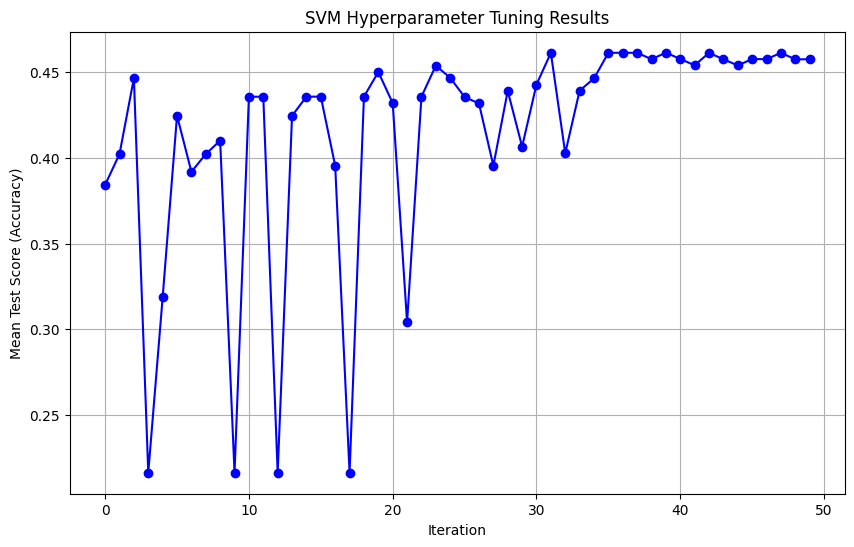

OrderedDict([('C', 10.0), ('gamma', 0.018941238267148986), ('kernel', 'rbf')])


In [52]:
# Calculate accuracy and get the tuned SVM model
accuracy, svm_tuned, best_hyperparameters= calculate_svm_classifier_accuracy_with_tuning(df_knn_norm)

# Access the results of the hyperparameter tuning
results_df = pd.DataFrame(svm_tuned.cv_results_)

# Plot the line chart
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['mean_test_score'], marker='o', linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Mean Test Score (Accuracy)')
plt.title('SVM Hyperparameter Tuning Results')
plt.grid(True)
plt.show()

print(best_hyperparameters)

###Mean_Hyperparameter tuning for SVM

/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
/usr/local/lib/python3.10/dist-packages/skopt/optimizer/optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


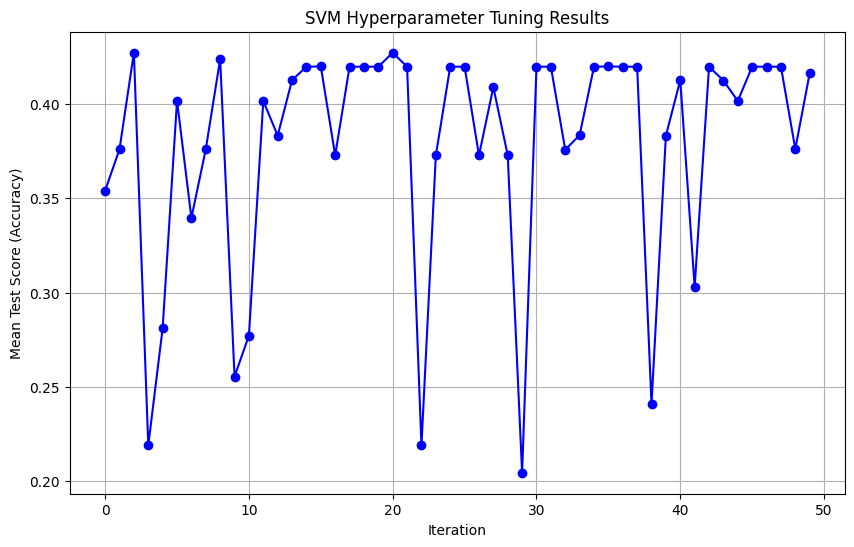

OrderedDict([('C', 0.7756486208064789), ('gamma', 0.32533825281254897), ('kernel', 'linear')])


In [53]:
# Calculate accuracy and get the tuned SVM model
accuracy, svm_tuned, best_hyperparameters= calculate_svm_classifier_accuracy_with_tuning(df_mean_norm)

# Access the results of the hyperparameter tuning
results_df = pd.DataFrame(svm_tuned.cv_results_)

# Plot the line chart
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['mean_test_score'], marker='o', linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Mean Test Score (Accuracy)')
plt.title('SVM Hyperparameter Tuning Results')
plt.grid(True)
plt.show()

print(best_hyperparameters)

###RF_Hyperparameter tuning for SVM

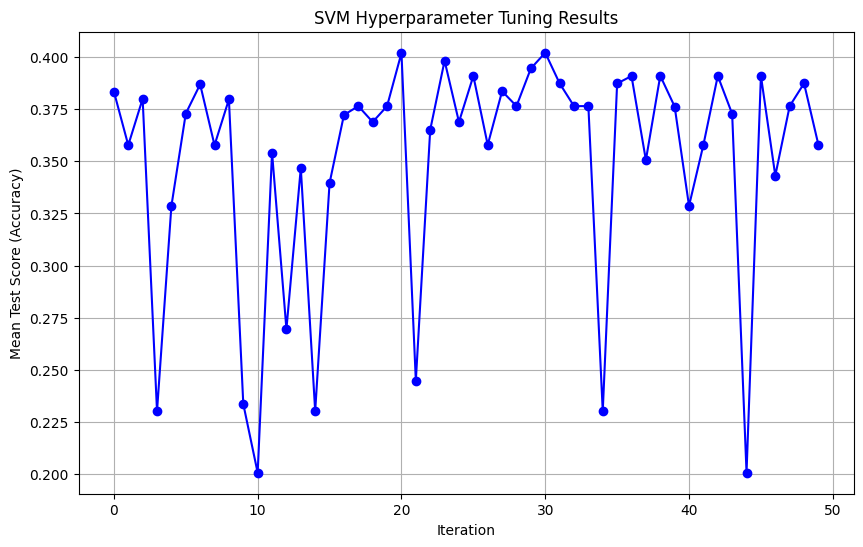

OrderedDict([('C', 3.61515329012682), ('gamma', 0.038482811837365676), ('kernel', 'rbf')])


In [54]:
# Calculate accuracy and get the tuned SVM model
accuracy, svm_tuned, best_hyperparameters= calculate_svm_classifier_accuracy_with_tuning(df_rf_norm)

# Access the results of the hyperparameter tuning
results_df = pd.DataFrame(svm_tuned.cv_results_)

# Plot the line chart
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['mean_test_score'], marker='o', linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Mean Test Score (Accuracy)')
plt.title('SVM Hyperparameter Tuning Results')
plt.grid(True)
plt.show()

print(best_hyperparameters)

#Linear Regression

In [55]:
def linear_regression_model(df_final):
    """
    Train a Linear Regression model on the input DataFrame and calculate performance metrics.
    Visualize the actual vs. predicted values using a line plot and scatter plot.

    Parameters:
        df_final (pd.DataFrame): The DataFrame containing the input features and the target variable 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_'.

    Returns:
        tuple: A tuple containing the Mean Squared Error (MSE), Root Mean Squared Error (RMSE), and R-squared (R2) of the model.
    """
    X = df_final.drop(columns=['City', 'Country', 'Region','Latitude_others_degrees_', 'Longitude_others_degrees_',
                               'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category', 'S1_mean_CDP_tCO2_', 'TOT_mean_CDP_tCO2_'])

    y = df_final['Scope_1_GHG_emissions_tCO2_or_tCO2_eq_']

    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Creating a Linear Regression model
    linear_regression = LinearRegression()

    # Training the model
    linear_regression.fit(X_train, y_train)

    # Predicting the labels for the training set
    y_pred_train = linear_regression.predict(X_train)

    # Predicting the labels for the test set
    y_pred_test = linear_regression.predict(X_test)

    # Calculating the mean squared error (MSE) of the model on the test set
    mse = mean_squared_error(y_test, y_pred_test)

    # Calculating Root Mean Squared Error (RMSE)
    rmse = mean_squared_error(y_test, y_pred_test, squared=False)

    # Calculating R2 Score
    r2 = r2_score(y_test, y_pred_test)

    # Get beta coefficients
    beta_coefficients = linear_regression.coef_

    return mse, rmse, r2, beta_coefficients
    # Visualize the actual vs. predicted values on the training set
    plt.figure(figsize=(10, 6))
    plt.scatter(y_train, y_pred_train, color='blue', label='Training Data')   # Blue dots for training data
    plt.scatter(y_test, y_pred_test, color='green', label='Test Data')        # Green dots for test data
    plt.plot([y_train.min(), y_train.max()], [y_train.min(), y_train.max()], 'r--', lw=2, label='Regression Line')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Actual vs. Predicted Values')
    plt.legend()
    plt.grid(True)
    plt.show()

    return mse, rmse, r2, beta_coefficients

##Linear_regression with df_knn

In [76]:
# Get all metrics from linear regession
mse, rmse, r2, beta_coefficients = linear_regression_model(df_knn_norm)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R2 Score:", r2)
print("Beta Coefficiants:", beta_coefficients)

Mean Squared Error: 65724908274438.984
Root Mean Squared Error: 8107090.000390953
R2 Score: 0.257324661107718
Beta Coefficiants: [  8015199.31378342   -102586.08116135    488625.24573434
    -67725.07239004  -1668405.94969371  -1414003.61075113
   1644813.57717288    126309.7340822    3195622.54112178
   -700955.73778228    824141.64652675   2846791.5647143
  -2404171.38478026   -146336.51279871   -226684.27153978
  -3587477.07347633   3469943.89916573   -266440.20650497
    398648.57342659   9755648.97903472 -15885363.11436592
   2868547.09186179   3697430.57558904    129811.27116267
  -2444767.70161494    129425.25346575  -6753625.006873
   8244798.45614199    420908.76076584   -121003.27763424
   -700228.60267402   -449961.64053327   -125078.51727292
   -103233.50485413    406520.17580475]


##linear_regression with DF_RF

In [64]:
# Get all metrics from linear regession
mse, rmse, r2, beta_coefficients = linear_regression_model(df_rf_norm)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R2 Score:", r2)
print("Beta Coefficiants:", beta_coefficients)

Mean Squared Error: 1907806449428602.0
Root Mean Squared Error: 43678443.76152385
R2 Score: -18.161325106725396
Beta Coefficiants: [ 8.25378712e+06 -1.54173850e+05 -3.45873063e+06 -1.45617914e+06
  2.48837016e+06 -2.57472901e+05 -1.70583424e+06  2.80014971e+07
  1.57603535e+07 -1.37918486e+07 -1.16360829e+05  9.30167171e+06
 -6.37811956e+06 -4.07865440e+06  5.37119644e+06 -9.26869014e+06
  6.04102654e+06 -3.88819690e+06  2.89126937e+05 -1.64915778e+06
 -2.59855588e+05 -6.78332481e+05 -2.05494736e+06  5.29246726e+05
 -1.04730937e+06  1.58916649e+06 -6.28849249e+06  5.47544251e+06
  3.10337334e+06 -2.25159864e+04 -1.53397306e+06 -7.25614932e+06
  6.47441012e+06  1.91146798e+06  1.89918689e+06]


##Linear_regression with DF_mean

In [65]:
# Get all metrics from linear regession
mse, rmse, r2, beta_coefficients = linear_regression_model(df_mean_norm)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R2 Score:", r2)
print("Beta Coefficiants:", beta_coefficients)

Mean Squared Error: 193653924396270.88
Root Mean Squared Error: 13915959.341571491
R2 Score: -0.9902810126440902
Beta Coefficiants: [ 11250311.56704433  -1895878.21302536  -2335973.64500569
    197309.43350703  -3387345.84269906  -2608441.09200961
   4269057.52506786    758529.23647756   8557978.02408889
  -8511014.67180346    496545.8581287   10460616.13476676
  -8114353.08145781  -1763489.30771873   1379126.80209415
 -20956977.22071546  19034361.74695353  -2458500.25867677
   1130026.06486957   8533979.34344911 -12598511.50040107
   4133524.33689147   3144428.5196843   -1059584.9422936
   -377567.05251933  -2031303.36442891  -5675738.95145839
   5999561.90931343   2233989.29539086   -561018.76358026
  -5397722.81587757  -1854358.62085108   1851969.23556215
   -382344.89927949   2636366.40640153]


#Random Forest Regression

In [71]:
def random_forest_regressor_model(df, target_col, n_estimators=100, test_size=0.2, random_state=42):
    """
    Train a Random Forest Regressor on the input DataFrame and calculate performance metrics.

    Parameters:
        df (pd.DataFrame): The DataFrame containing the input features and the target variable.
        target_col (str): The name of the column containing the target variable in the DataFrame.
        n_estimators (int, optional): The number of trees in the forest (default is 100).
        test_size (float, optional): The proportion of the dataset to include in the test split (default is 0.2).
        random_state (int, optional): Seed used by the random number generator (default is 42).

    Returns:
        tuple: A tuple containing the Mean Squared Error (MSE), Root Mean Squared Error (RMSE), and R-squared (R2) of the regressor.
    """
    # Extracting the input features (X) and the target variable (y) from the DataFrame

    X = df.drop(columns=['City', 'Country', 'Region','Latitude_others_degrees_', 'Longitude_others_degrees_',
                               'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', 'Year_of_emission', 'category', 'S1_mean_CDP_tCO2_', 'TOT_mean_CDP_tCO2_'])
    y = df['Scope_1_GHG_emissions_tCO2_or_tCO2_eq_']
    # Splitting the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Creating a Random Forest Regressor with the specified number of trees
    rf_regressor = RandomForestRegressor(n_estimators=n_estimators)

    # Training the regressor
    rf_regressor.fit(X_train, y_train)

    # Predicting the labels for the test set
    y_pred = rf_regressor.predict(X_test)

    # Calculating the mean squared error (MSE) of the regressor
    mse = mean_squared_error(y_test, y_pred)

    # Calculating Root Mean Squared Error (RMSE)
    rmse = mean_squared_error(y_test, y_pred, squared=False)

    # Calculating R2 Score
    r2 = r2_score(y_test, y_pred)

     # The higher, the more important the feature
    feature_importances = rf_regressor.feature_importances_

    # The red dashed line at y=0 represents the correct prediction, and points above or below this line indicate overestimation or underestimation, respectively.
    # This visualization helps us understand how far each point deviates from the true value and gives us insight into the model's performance.

    errors = y_pred - y_test
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, errors, color='blue')
    plt.axhline(0, color='red', linestyle='--', lw=2)
    plt.xlabel('Actual Values')
    plt.ylabel('Prediction Errors')
    plt.title('Actual vs. Prediction Errors')
    plt.grid(True)
    plt.show()

    return mse, rmse, r2, feature_importances

##Random forest Regression with DF_KNN

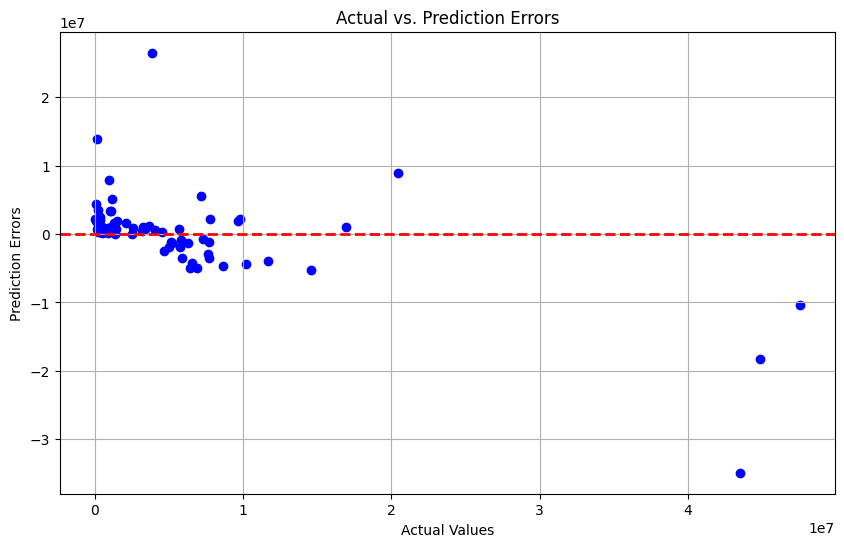

Mean Squared Error: 44623938199054.91
Root Mean Squared Error: 6680115.1336676
R2 Score: 0.4957604461567545
feature_importances: [0.33057345 0.01314461 0.01102673 0.01443635 0.0097825  0.02556972
 0.09899369 0.03752186 0.0557661  0.03624477 0.03569463 0.0126095
 0.0135711  0.00986148 0.00605856 0.00747394 0.01784891 0.00445153
 0.03955402 0.02270116 0.02452936 0.0089895  0.00210572 0.01604111
 0.00517427 0.0090786  0.0076607  0.04635783 0.03522464 0.00419396
 0.00459303 0.00790205 0.00686664 0.00490834 0.01348968]


In [78]:
# Get all metrics from random forest regession
mse, rmse, r2, feature_importances = random_forest_regressor_model(df_knn_norm, target_col='Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', n_estimators=100, test_size=0.2, random_state=42)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R2 Score:", r2)
#random forest regession don´t provide a beta coefficiant metric, so I used importance of features to get a estimations of importance
print("feature_importances:", feature_importances)

## Random forest Regression with DF_RF

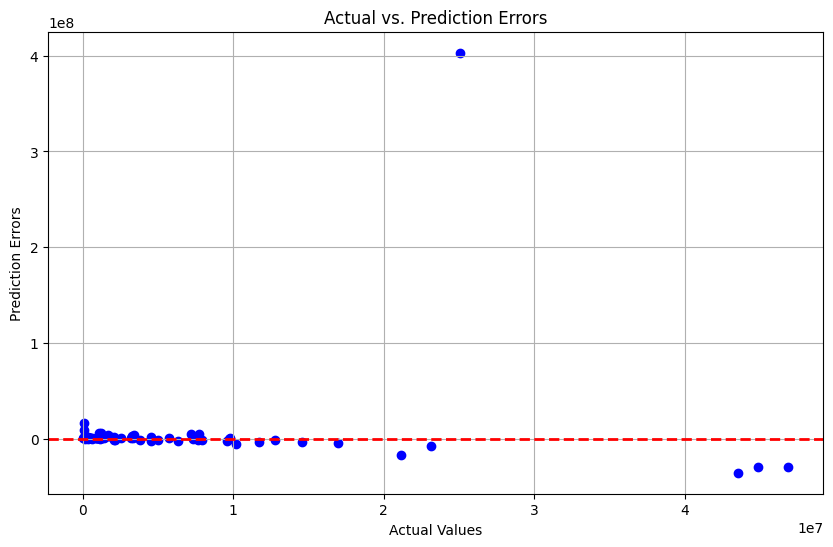

Mean Squared Error: 2413474780280934.5
Root Mean Squared Error: 49127128.760807246
R2 Score: -23.240076825244177
feature_importances: [1.58881004e-01 1.37463277e-02 4.74610776e-03 4.55532990e-03
 1.36753296e-03 7.97739337e-03 3.48055418e-03 5.64709363e-01
 1.05312424e-01 8.09757532e-03 8.66964286e-03 1.40833257e-03
 6.32020973e-03 1.18536874e-02 1.73979248e-03 8.62580306e-04
 3.44908564e-03 2.23280407e-02 6.02133551e-03 3.12505281e-03
 2.59869304e-03 1.98973733e-03 2.48919078e-03 2.86870839e-03
 1.43287921e-03 4.57206422e-04 4.60695595e-03 1.42170787e-02
 1.67489337e-02 2.32376240e-03 2.87903409e-03 1.14471671e-03
 9.67955800e-04 2.35068124e-03 4.27309438e-03]


In [74]:
# Get all metrics from random forest regession
mse, rmse, r2, feature_importances  = random_forest_regressor_model(df_rf_norm, target_col='Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', n_estimators=100, test_size=0.2, random_state=42)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R2 Score:", r2)
#random forest regession don´t provide a beta coefficiant metric, so I used importance of features to get a estimations of importance
print("feature_importances:", feature_importances)

##Random forest Regression with DF_Mean

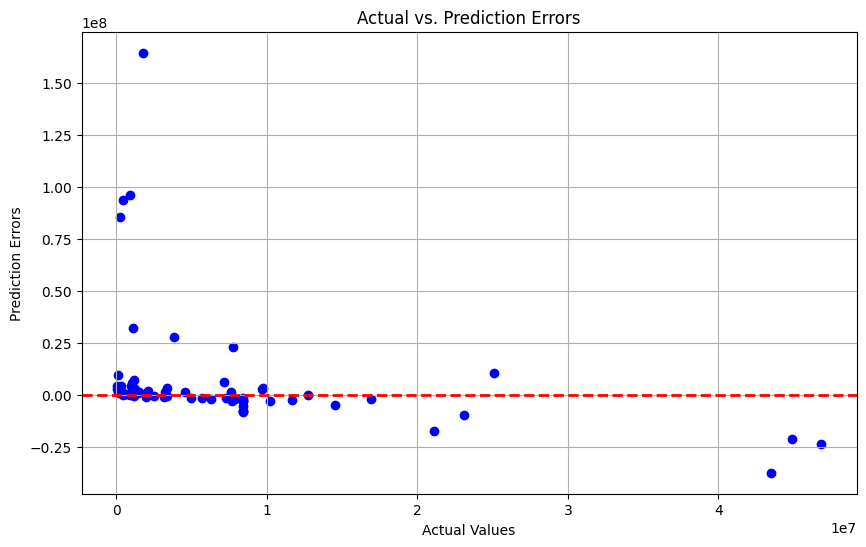

Mean Squared Error: 843994867235006.2
Root Mean Squared Error: 29051589.754004966
R2 Score: -7.674169471461793
feature_importances: [0.28323394 0.00308092 0.13536643 0.0028895  0.02087449 0.01587771
 0.0790419  0.00794735 0.02567723 0.11947    0.02210776 0.0025834
 0.00151454 0.00232303 0.00208327 0.04820682 0.02049871 0.00330508
 0.01242471 0.00766093 0.01411738 0.00283689 0.00198054 0.00455151
 0.00089275 0.00187462 0.00304476 0.04301566 0.02175329 0.01027014
 0.07071323 0.00122158 0.00059565 0.00112668 0.00583759]


In [75]:
# Get all metrics from random forest regession
mse, rmse, r2, feature_importances  = random_forest_regressor_model(df_mean_norm, target_col='Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', n_estimators=100, test_size=0.2, random_state=42)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)
print("R2 Score:", r2)
#random forest regession don´t provide a beta coefficiant metric, so I used importance of features to get a estimations of importance
print("feature_importances:", feature_importances)

# Maps

In [ ]:
# Load Data for Map Creation
df_rf = pd.read_csv(data+'Random Forest imputiert ohne Colinear.csv', sep=',')
df_knn = pd.read_csv(data+'kNN Imputiert ohne Colinear.csv', sep=',')

In [ ]:
# Rename specific country to be found by geopandas
df_rf['Country'].replace('USA', 'United States of America', inplace=True)

##Create Map with all dataset Countries

<ipython-input-72-871216b90b20>:9: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


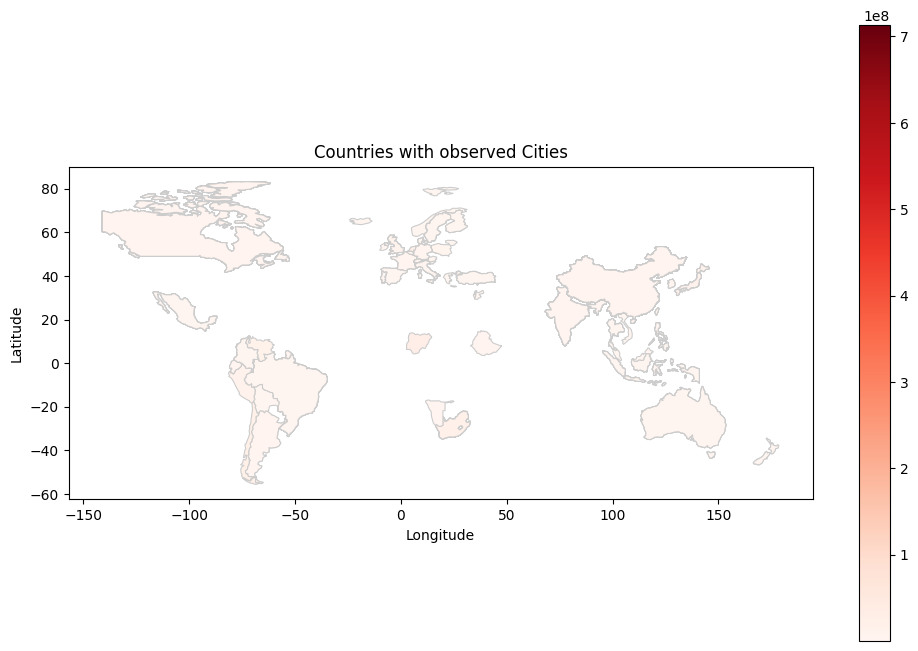

In [ ]:
# Creating Map with all countries with observed cities


# Create a dummy DataFrame with dummy CO2 emissions data
frame= df_rf[['City', 'Country', 'Region','Latitude_others_degrees_', 'Longitude_others_degrees_',
       'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_']]

# Load the world shapefile data from geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
# print(world)
# Merge the world shapefile with the CO2 emissions data
merged = world.merge(frame, left_on='name', right_on='Country')
# Plot the map
fig, ax = plt.subplots(figsize=(12, 8))
merged.plot(column='Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Set the axis labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Countries with observed Cities')

# Show the map
plt.show()

## Map sum up all observed cities

<ipython-input-47-22605c39f7fa>:12: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


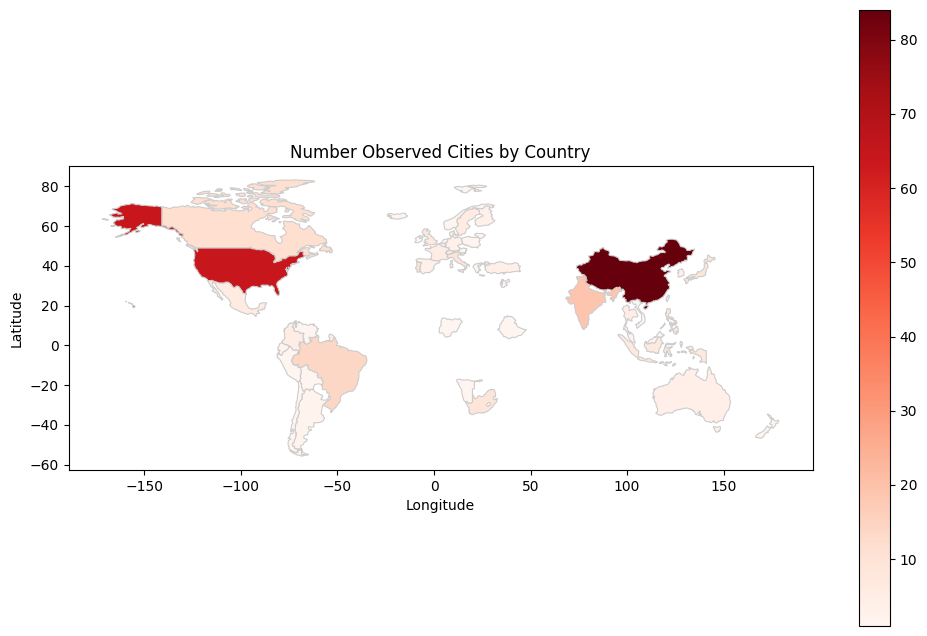

In [ ]:

# Create DataFrame
frame = df_rf[['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_', 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_']]

# Sum up Scope_1_GHG_emissions_tCO2_or_tCO2_eq_ for each country
sum_by_country = frame.groupby('Country')['Scope_1_GHG_emissions_tCO2_or_tCO2_eq_'].count().reset_index()

# Load the world shapefile data from geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Merge the world shapefile with the CO2 emissions data
merged = world.merge(sum_by_country, left_on='name', right_on='Country')

# Plot the map
fig, ax = plt.subplots(figsize=(12, 8))
merged.plot(column='Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Set the axis labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Number Observed Cities by Country')

# Show the map
plt.show()

##Map sum up all Scope 1

<ipython-input-121-e384924a3e1a>:13: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



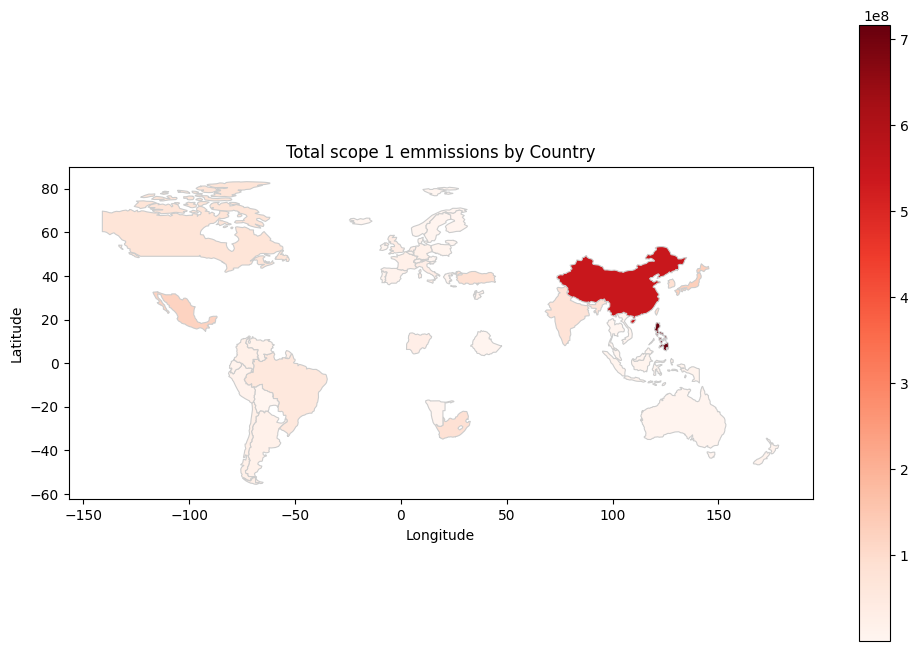

In [ ]:


# Create  DataFrame
frame = df_rf[['City', 'Country', 'Region', 'Latitude_others_degrees_', 'Longitude_others_degrees_', 'Scope_1_GHG_emissions_tCO2_or_tCO2_eq_']]

# Sum up Scope_1_GHG_emissions_tCO2_or_tCO2_eq_ for each country
sum_by_country = frame.groupby('Country')['Scope_1_GHG_emissions_tCO2_or_tCO2_eq_'].sum().reset_index()

# Load the world shapefile data from geopandas
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Merge the world shapefile with the CO2 emissions data
merged = world.merge(sum_by_country, left_on='name', right_on='Country')

# Plot the map
fig, ax = plt.subplots(figsize=(12, 8))
merged.plot(column='Scope_1_GHG_emissions_tCO2_or_tCO2_eq_', cmap='Reds', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True)

# Set the axis labels and title
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Total scope 1 emmissions by Country')

# Show the map
plt.show()

## Map with all Cities

In [ ]:

# Create the scattermapbox trace
fig = go.Figure(go.Scattermapbox(
    lat=df_rf['Latitude_others_degrees_'],
    lon=df_rf['Longitude_others_degrees_'],
    mode='markers',
    marker=dict(size=3.6, color='#B02F2C'),
    text=df_rf['City']
))

# Update the layout of the map
fig.update_layout(
    mapbox=dict(
        style='carto-positron',
        center=dict(lat=df_rf['Latitude_others_degrees_'].mean(), lon=df_rf['Longitude_others_degrees_'].mean()),
        zoom=0.5
    ),
    showlegend=False
)

# Show the map
fig.show()

##Map with Ratio of Emmission an Population


In [ ]:

# Calculate Ratio of Emmission and Population
df_rf['emm/pop'] = df_rf['Scope_1_GHG_emissions_tCO2_or_tCO2_eq_'] / df_rf['Population_others_']

# Create Scattermapbox Trace with point in proportional size
fig = go.Figure(go.Scattermapbox(
    lat=df_rf['Latitude_others_degrees_'],
    lon=df_rf['Longitude_others_degrees_'],
    mode='markers',
    marker=dict(size=df_rf['emm/pop'] * 0.8, color='#B02F2C'
                ),
    text=df_rf['City']
))

# Update the layout of the map
fig.update_layout(
    mapbox=dict(
        style='carto-positron',
        center=dict(lat=df_rf['Latitude_others_degrees_'].mean(), lon=df_rf['Longitude_others_degrees_'].mean()),
        zoom=1.5
    ),
    showlegend=False
)

# Show the map
fig.show()